In [1]:
import sys
import os
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
import matplotlib as mpl
import matplotlib.patches as patches
from descartes.patch import PolygonPatch
from shapely.geometry import Point,MultiPoint,MultiPolygon,Polygon,box,LineString
from shapely import affinity
from shapely import geometry
import ipywidgets as widgets
import ipywidgets.widgets.interaction
from ipywidgets import *
import random
import pandas as pd

import re
import pickle
import time
import warnings
warnings.simplefilter('ignore', np.RankWarning)

%load_ext autoreload

In [2]:
pwd()

'/media/charly/Data/Lab/Projects/uJ/experiments_ms_pBGT/pBGT-AMP-Pulse'

In [3]:
path_to_uj="/home/esb/Projects/uJ/local/current/uJ_src_SingleChan/python/"
path_to_uj='/home/charly/Lab/Projects/uJ/local/current/uJ_src_SingleChan/python/'

sys.path.insert(0, path_to_uj)


In [4]:
%autoreload 2
from readroi import *
from DataManagers import *
from TrackingFunctions import *
from PlottingFunctions import *
from AnalysisFunctions import *

Importing readroi
DataStructs...1loaded!
DataManagers...loaded!
TrackingFunctions... 1loaded!
PlottingFunctions... loaded p2!
> Analysis Functions loaded


## Experiment Parameters

In [5]:

uj_data_path="/home/charly/Lab/Projects/uJ/uJ_data/"
#uj_data_path="/home/charly/Lab/Projects/uJ/uJ_data_online/"


expeLabel="pBGT-AMP-Pulse"

rootDir=uj_data_path+"pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/"

trap_list="xy01,xy02,xy03,xy11,xy12,xy13,xy14,xy20,xy21,xy22,xy23,xy25,xy26,xy27,xy28,xy29,xy30,xy33,xy34,xy35,xy36,xy37,xy39,xy40,xy41,xy42,xy43,xy44,xy45,xy46,xy47".split(",")

print(rootDir)


toFile=True
#Parameters 

frame2min=10

figxlim=640
figylim=512
flims=(figxlim,figylim)


frame_experiment_start=20;
frame_experiment_end=44
frame_signal_start=26
frame_signal_end=34
frame_norm_start=20
frame_norm_end=25
frame_analysis_end=44


t_experiment_start=0
t_signal_start=(frame_signal_start-frame_experiment_start)*frame2min  
t_signal_end=(frame_signal_end-frame_experiment_start)*frame2min
t_experiment_end=(frame_experiment_end-frame_experiment_start)*frame2min

frames=range(int(frame_experiment_start),int(frame_experiment_end+1))
frames_list=[x for x in frames]
times=[(this_frame-frame_experiment_start)*frame2min for this_frame in frames]
times_hour=[(this_frame-frame_experiment_start)*frame2min/60 for this_frame in frames]




data_type="normData"


dirNameTimeSeries_Imgs=rootDir+'figures/lineages/time_series/'
if not os.path.exists(dirNameTimeSeries_Imgs):
    print("making dir TimeSeriesImages...")
    os.makedirs(dirNameTimeSeries_Imgs)

dirNameDATALINEAGES=rootDir+'data/lineages/'
if not os.path.exists(dirNameDATALINEAGES):
    print("making dir lineages...")
    os.makedirs(dirNameDATALINEAGES)

#Prepare file system
dataPath="%sdata/GFP/"%rootDir


/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/


# uJ_Visualizer

### Load tracked cells

In [ ]:
# trap_list=trap_list[1:2]
# trap_list

In [6]:
max_frames=-1

trap_tracked_cells=[]
for trap in trap_list:
    dirNameTRACKEDCELLS=rootDir+'data_cells_tracked/'+trap+"/"+data_type+"/"
    tracked_cells=load_cells(dirNameTRACKEDCELLS,max_frames)
    trap_tracked_cells.append(tracked_cells)

0: Loading pBGT-AMP-Pulse_xy01_020.pkl
1: Loading pBGT-AMP-Pulse_xy01_021.pkl
2: Loading pBGT-AMP-Pulse_xy01_022.pkl
3: Loading pBGT-AMP-Pulse_xy01_023.pkl
4: Loading pBGT-AMP-Pulse_xy01_024.pkl
5: Loading pBGT-AMP-Pulse_xy01_025.pkl
6: Loading pBGT-AMP-Pulse_xy01_026.pkl
7: Loading pBGT-AMP-Pulse_xy01_027.pkl
8: Loading pBGT-AMP-Pulse_xy01_028.pkl
9: Loading pBGT-AMP-Pulse_xy01_029.pkl
10: Loading pBGT-AMP-Pulse_xy01_030.pkl
11: Loading pBGT-AMP-Pulse_xy01_031.pkl
12: Loading pBGT-AMP-Pulse_xy01_032.pkl
13: Loading pBGT-AMP-Pulse_xy01_033.pkl
14: Loading pBGT-AMP-Pulse_xy01_034.pkl
15: Loading pBGT-AMP-Pulse_xy01_035.pkl
16: Loading pBGT-AMP-Pulse_xy01_036.pkl
17: Loading pBGT-AMP-Pulse_xy01_037.pkl
18: Loading pBGT-AMP-Pulse_xy01_038.pkl
19: Loading pBGT-AMP-Pulse_xy01_039.pkl
20: Loading pBGT-AMP-Pulse_xy01_040.pkl
21: Loading pBGT-AMP-Pulse_xy01_041.pkl
22: Loading pBGT-AMP-Pulse_xy01_042.pkl
23: Loading pBGT-AMP-Pulse_xy01_043.pkl
24: Loading pBGT-AMP-Pulse_xy01_044.pkl
0: Loading

7: Loading pBGT-AMP-Pulse_xy21_027.pkl
8: Loading pBGT-AMP-Pulse_xy21_028.pkl
9: Loading pBGT-AMP-Pulse_xy21_029.pkl
10: Loading pBGT-AMP-Pulse_xy21_030.pkl
11: Loading pBGT-AMP-Pulse_xy21_031.pkl
12: Loading pBGT-AMP-Pulse_xy21_032.pkl
13: Loading pBGT-AMP-Pulse_xy21_033.pkl
14: Loading pBGT-AMP-Pulse_xy21_034.pkl
15: Loading pBGT-AMP-Pulse_xy21_035.pkl
16: Loading pBGT-AMP-Pulse_xy21_036.pkl
17: Loading pBGT-AMP-Pulse_xy21_037.pkl
18: Loading pBGT-AMP-Pulse_xy21_038.pkl
19: Loading pBGT-AMP-Pulse_xy21_039.pkl
20: Loading pBGT-AMP-Pulse_xy21_040.pkl
21: Loading pBGT-AMP-Pulse_xy21_041.pkl
22: Loading pBGT-AMP-Pulse_xy21_042.pkl
23: Loading pBGT-AMP-Pulse_xy21_043.pkl
24: Loading pBGT-AMP-Pulse_xy21_044.pkl
0: Loading pBGT-AMP-Pulse_xy22_020.pkl
1: Loading pBGT-AMP-Pulse_xy22_021.pkl
2: Loading pBGT-AMP-Pulse_xy22_022.pkl
3: Loading pBGT-AMP-Pulse_xy22_023.pkl
4: Loading pBGT-AMP-Pulse_xy22_024.pkl
5: Loading pBGT-AMP-Pulse_xy22_025.pkl
6: Loading pBGT-AMP-Pulse_xy22_026.pkl
7: Loading

14: Loading pBGT-AMP-Pulse_xy30_034.pkl
15: Loading pBGT-AMP-Pulse_xy30_035.pkl
16: Loading pBGT-AMP-Pulse_xy30_036.pkl
17: Loading pBGT-AMP-Pulse_xy30_037.pkl
18: Loading pBGT-AMP-Pulse_xy30_038.pkl
19: Loading pBGT-AMP-Pulse_xy30_039.pkl
20: Loading pBGT-AMP-Pulse_xy30_040.pkl
21: Loading pBGT-AMP-Pulse_xy30_041.pkl
22: Loading pBGT-AMP-Pulse_xy30_042.pkl
23: Loading pBGT-AMP-Pulse_xy30_043.pkl
24: Loading pBGT-AMP-Pulse_xy30_044.pkl
0: Loading pBGT-AMP-Pulse_xy33_020.pkl
1: Loading pBGT-AMP-Pulse_xy33_021.pkl
2: Loading pBGT-AMP-Pulse_xy33_022.pkl
3: Loading pBGT-AMP-Pulse_xy33_023.pkl
4: Loading pBGT-AMP-Pulse_xy33_024.pkl
5: Loading pBGT-AMP-Pulse_xy33_025.pkl
6: Loading pBGT-AMP-Pulse_xy33_026.pkl
7: Loading pBGT-AMP-Pulse_xy33_027.pkl
8: Loading pBGT-AMP-Pulse_xy33_028.pkl
9: Loading pBGT-AMP-Pulse_xy33_029.pkl
10: Loading pBGT-AMP-Pulse_xy33_030.pkl
11: Loading pBGT-AMP-Pulse_xy33_031.pkl
12: Loading pBGT-AMP-Pulse_xy33_032.pkl
13: Loading pBGT-AMP-Pulse_xy33_033.pkl
14: Loadin

21: Loading pBGT-AMP-Pulse_xy41_041.pkl
22: Loading pBGT-AMP-Pulse_xy41_042.pkl
23: Loading pBGT-AMP-Pulse_xy41_043.pkl
24: Loading pBGT-AMP-Pulse_xy41_044.pkl
0: Loading pBGT-AMP-Pulse_xy42_020.pkl
1: Loading pBGT-AMP-Pulse_xy42_021.pkl
2: Loading pBGT-AMP-Pulse_xy42_022.pkl
3: Loading pBGT-AMP-Pulse_xy42_023.pkl
4: Loading pBGT-AMP-Pulse_xy42_024.pkl
5: Loading pBGT-AMP-Pulse_xy42_025.pkl
6: Loading pBGT-AMP-Pulse_xy42_026.pkl
7: Loading pBGT-AMP-Pulse_xy42_027.pkl
8: Loading pBGT-AMP-Pulse_xy42_028.pkl
9: Loading pBGT-AMP-Pulse_xy42_029.pkl
10: Loading pBGT-AMP-Pulse_xy42_030.pkl
11: Loading pBGT-AMP-Pulse_xy42_031.pkl
12: Loading pBGT-AMP-Pulse_xy42_032.pkl
13: Loading pBGT-AMP-Pulse_xy42_033.pkl
14: Loading pBGT-AMP-Pulse_xy42_034.pkl
15: Loading pBGT-AMP-Pulse_xy42_035.pkl
16: Loading pBGT-AMP-Pulse_xy42_036.pkl
17: Loading pBGT-AMP-Pulse_xy42_037.pkl
18: Loading pBGT-AMP-Pulse_xy42_038.pkl
19: Loading pBGT-AMP-Pulse_xy42_039.pkl
20: Loading pBGT-AMP-Pulse_xy42_040.pkl
21: Loadin

# Make the lineages

In [7]:
trap_lineages=[]
for i,trap in enumerate(trap_list):
    tracked_cells=trap_tracked_cells[i]
    this_lineages=make_cellLineages_all(tracked_cells,frame_experiment_start)
    trap_lineages.append(this_lineages)
    print(len(this_lineages))

DataManagers...loaded!
DataStructs...1loaded!
TrackingFunctions... 1loaded!

Making lineages of 14 cells from frame 24 out of 14

 ['44.000']	........................
 ['44.001']	........................
 ['44.002']	........................
 ['44.003']	.*3 - 3
 ['44.004']	.........*3 - 3
 ['44.005']	.......*3 - 3
 ['44.006']	........................
 ['44.007']	.*4 - 3
 ['44.008']	........................
 ['44.009']	........................
 ['44.010']	........................
 ['44.011']	........................
 ['44.012']	........................
 ['44.013']	..*9 - 7
Making lineages of 2 cells from frame 23 out of 13

 ['43.003']	.......................
 ['43.012']	....*10 - 8
Making lineages of 0 cells from frame 22 out of 12

Making lineages of 3 cells from frame 21 out of 15

 ['41.001']	.....................
 ['41.013']	.....................
 ['41.014']	.....................
Making lineages of 11 cells from frame 20 out of 26

 ['40.000']	....................
 ['40.001']	.....*

 ['44.104']	.................*35 - 33
 ['44.105']	..................*35 - 35
 ['44.106']	........................
 ['44.107']	.*36 - 9
 ['44.108']	.....................*36 - 28
 ['44.109']	...*36 - 33
 ['44.110']	..........*36 - 33
 ['44.111']	.*36 - 33
 ['44.112']	.........*36 - 33
 ['44.113']	..*36 - 33
 ['44.114']	.....*36 - 32
 ['44.115']	........................
 ['44.116']	..*37 - 32
 ['44.117']	.*37 - 35
 ['44.118']	...*37 - 35
 ['44.119']	...*37 - 33
 ['44.120']	............*37 - 28
 ['44.121']	........................
 ['44.122']	.*38 - 38
 ['44.123']	....*38 - 28
 ['44.124']	...*38 - 38
 ['44.125']	..*38 - 28
 ['44.126']	........................
 ['44.127']	........................
 ['44.128']	................*40 - 40
Making lineages of 16 cells from frame 23 out of 133

 ['43.000']	.*40 - 2
 ['43.002']	.......................
 ['43.006']	..*41 - 7
 ['43.008']	..*41 - 1
 ['43.010']	.*41 - 1
 ['43.016']	.....*41 - 41
 ['43.065']	.*41 - 24
 ['43.070']	.*41 - 19
 ['43.084']	.*41

 ['26.126']	......
 ['26.133']	......
 ['26.145']	.*125 - 90
 ['26.159']	..*125 - 93
 ['26.169']	..*125 - 95
 ['26.170']	......
 ['26.176']	.*126 - 53
Making lineages of 112 cells from frame 5 out of 265

 ['25.000']	.*126 - 116
 ['25.003']	...*126 - 77
 ['25.009']	.....
 ['25.011']	.*127 - 15
 ['25.015']	.....
 ['25.017']	.....
 ['25.019']	.*129 - 77
 ['25.021']	.....
 ['25.034']	...*130 - 64
 ['25.040']	.*130 - 130
 ['25.045']	.....
 ['25.050']	.....
 ['25.051']	.....
 ['25.057']	..*133 - 21
 ['25.063']	....*133 - 132
 ['25.076']	.....
 ['25.077']	..*134 - 58
 ['25.079']	.....
 ['25.081']	....*135 - 121
 ['25.084']	.....
 ['25.086']	.....
 ['25.088']	.*137 - 136
 ['25.089']	.....
 ['25.091']	.....
 ['25.093']	...*139 - 136
 ['25.094']	.....
 ['25.096']	.....
 ['25.099']	.....
 ['25.102']	.....
 ['25.111']	.....
 ['25.112']	.....
 ['25.117']	.....
 ['25.120']	..*146 - 44
 ['25.121']	.....
 ['25.124']	.....
 ['25.125']	.....
 ['25.126']	.....
 ['25.127']	.*150 - 148
 ['25.130']	.....
 

 ['43.051']	...............*45 - 16
 ['43.057']	.......*45 - 24
Making lineages of 14 cells from frame 22 out of 81

 ['42.002']	.................*45 - 43
 ['42.009']	......................
 ['42.017']	......................
 ['42.020']	.................*47 - 13
 ['42.029']	.....*47 - 16
 ['42.031']	......................
 ['42.032']	......................
 ['42.038']	........*49 - 44
 ['42.045']	...........*49 - 45
 ['42.049']	........*49 - 45
 ['42.055']	.*49 - 16
 ['42.057']	.*49 - 20
 ['42.075']	..*49 - 33
 ['42.076']	.......*49 - 39
Making lineages of 13 cells from frame 21 out of 91

 ['41.001']	.......*49 - 6
 ['41.009']	................*49 - 3
 ['41.015']	..........*49 - 43
 ['41.038']	.*49 - 21
 ['41.040']	...*49 - 18
 ['41.052']	...........*49 - 16
 ['41.059']	...*49 - 45
 ['41.066']	....*49 - 28
 ['41.071']	.*49 - 24
 ['41.074']	.....................
 ['41.077']	.*50 - 50
 ['41.080']	...............*50 - 27
 ['41.083']	.....................
Making lineages of 8 cells from fr

 ['44.006']	........................
 ['44.007']	.*5 - 1
 ['44.008']	..*5 - 3
 ['44.009']	.........*5 - 4
 ['44.010']	..*5 - 4
 ['44.011']	........*5 - 2
 ['44.012']	........................
 ['44.013']	...*6 - 2
 ['44.014']	..........*6 - 2
 ['44.015']	....*6 - 6
 ['44.016']	...*6 - 2
 ['44.017']	.*6 - 2
 ['44.018']	.*6 - 2
 ['44.019']	..*6 - 2
 ['44.020']	..*6 - 6
 ['44.021']	..*6 - 2
 ['44.022']	.*6 - 6
 ['44.023']	........................
 ['44.024']	.*7 - 7
 ['44.025']	......*7 - 3
 ['44.026']	..*7 - 7
 ['44.027']	........................
 ['44.028']	................*8 - 3
 ['44.029']	........................
 ['44.030']	........................
 ['44.031']	......*10 - 7
 ['44.032']	........................
 ['44.033']	................*11 - 11
 ['44.034']	....*11 - 9
 ['44.035']	.*11 - 7
 ['44.036']	....*11 - 3
 ['44.037']	........................
 ['44.038']	.*12 - 9
 ['44.039']	...*12 - 3
 ['44.040']	.........*12 - 7
 ['44.041']	.....*12 - 7
 ['44.042']	........................


 ['34.096']	....*46 - 41
 ['34.097']	.*46 - 37
 ['34.103']	.......*46 - 40
 ['34.105']	.*46 - 1
Making lineages of 23 cells from frame 13 out of 110

 ['33.000']	...*46 - 1
 ['33.001']	..*46 - 6
 ['33.002']	.*46 - 1
 ['33.010']	..*46 - 1
 ['33.023']	.......*46 - 3
 ['33.041']	.*46 - 10
 ['33.042']	..*46 - 17
 ['33.047']	......*46 - 26
 ['33.050']	.*46 - 10
 ['33.052']	..*46 - 28
 ['33.065']	.............
 ['33.074']	.............
 ['33.081']	.*48 - 48
 ['33.091']	..........*48 - 40
 ['33.093']	..*48 - 30
 ['33.096']	....*48 - 41
 ['33.099']	..*48 - 41
 ['33.100']	..*48 - 29
 ['33.101']	..*48 - 29
 ['33.104']	..*48 - 41
 ['33.106']	.*48 - 39
 ['33.107']	.*48 - 41
 ['33.108']	.*48 - 39
Making lineages of 11 cells from frame 12 out of 110

 ['32.009']	............
 ['32.012']	............
 ['32.040']	...........*50 - 43
 ['32.050']	............
 ['32.051']	.....*51 - 24
 ['32.052']	.....*51 - 43
 ['32.082']	............
 ['32.084']	...*52 - 34
 ['32.092']	....*52 - 45
 ['32.096']	.*52 - 3

 ['23.231']	..*177 - 151
 ['23.233']	.*177 - 88
 ['23.234']	.*177 - 29
 ['23.235']	...
 ['23.236']	...
 ['23.238']	.*179 - 53
 ['23.240']	...
 ['23.242']	..*180 - 40
Making lineages of 39 cells from frame 2 out of 238

 ['22.001']	..
 ['22.004']	..
 ['22.005']	..
 ['22.006']	..
 ['22.007']	..
 ['22.012']	.*185 - 163
 ['22.014']	..
 ['22.017']	..
 ['22.026']	.*187 - 60
 ['22.039']	..
 ['22.045']	..
 ['22.051']	..
 ['22.052']	.*190 - 128
 ['22.053']	..
 ['22.058']	..
 ['22.060']	.*192 - 128
 ['22.070']	..
 ['22.078']	.*193 - 192
 ['22.084']	..
 ['22.099']	..
 ['22.114']	.*195 - 145
 ['22.139']	..
 ['22.151']	..
 ['22.160']	..
 ['22.165']	..
 ['22.172']	..
 ['22.194']	..
 ['22.202']	..
 ['22.203']	..
 ['22.204']	..
 ['22.211']	..
 ['22.213']	..
 ['22.226']	.*206 - 151
 ['22.228']	.*206 - 150
 ['22.230']	.*206 - 151
 ['22.231']	..*206 - 41
 ['22.232']	.*206 - 105
 ['22.235']	..
 ['22.237']	..*207 - 41
Making lineages of 41 cells from frame 1 out of 248

 ['21.001']	.
 ['21.002']	.
 ['21.00

 ['44.223']	...........*58 - 55
 ['44.224']	........................
 ['44.225']	..*59 - 48
 ['44.226']	.*59 - 58
 ['44.227']	.*59 - 55
 ['44.228']	........................
 ['44.229']	.............*60 - 56
 ['44.230']	.*60 - 42
 ['44.231']	........................
 ['44.232']	.*61 - 52
 ['44.233']	.*61 - 42
 ['44.234']	...*61 - 60
 ['44.235']	......*61 - 46
 ['44.236']	.................*61 - 49
 ['44.237']	........................
 ['44.238']	........*62 - 34
 ['44.239']	.*62 - 57
 ['44.240']	..*62 - 40
 ['44.241']	........................
 ['44.242']	.........*63 - 62
 ['44.243']	....*63 - 58
 ['44.244']	.*63 - 53
 ['44.245']	........................
 ['44.246']	.*64 - 49
 ['44.247']	.......*64 - 48
 ['44.248']	........................
 ['44.249']	........................
 ['44.250']	........*66 - 61
 ['44.251']	.....*66 - 42
 ['44.252']	........................
 ['44.253']	.*67 - 50
 ['44.254']	......*67 - 65
 ['44.255']	...................*67 - 52
 ['44.256']	.*67 - 61
 ['44.257']	

 ['38.045']	.............*107 - 33
 ['38.059']	..*107 - 27
 ['38.060']	...*107 - 13
 ['38.061']	.....*107 - 10
 ['38.069']	..................
 ['38.077']	..................
 ['38.114']	.*109 - 34
 ['38.128']	..................
 ['38.131']	.*110 - 35
 ['38.139']	....*110 - 29
 ['38.143']	.*110 - 43
 ['38.150']	...*110 - 45
 ['38.174']	...*110 - 45
 ['38.208']	..................
 ['38.223']	.....*111 - 75
 ['38.226']	...*111 - 111
 ['38.228']	....*111 - 75
 ['38.243']	..................
 ['38.260']	.*112 - 73
 ['38.262']	.*112 - 75
 ['38.265']	.....*112 - 79
 ['38.266']	.................*112 - 88
 ['38.272']	..*112 - 93
 ['38.273']	..*112 - 61
 ['38.274']	....*112 - 73
 ['38.275']	..*112 - 79
Making lineages of 25 cells from frame 17 out of 272

 ['37.000']	.*112 - 101
 ['37.005']	..*112 - 101
 ['37.007']	..*112 - 102
 ['37.011']	.*112 - 101
 ['37.041']	.*112 - 97
 ['37.057']	.*112 - 4
 ['37.073']	...*112 - 13
 ['37.079']	.*112 - 5
 ['37.082']	.......*112 - 16
 ['37.109']	..*112 - 28
 ['

 ['23.000']	...
 ['23.003']	.*284 - 249
 ['23.004']	..*284 - 102
 ['23.010']	...
 ['23.019']	...
 ['23.031']	..*286 - 103
 ['23.032']	.*286 - 260
 ['23.051']	...
 ['23.055']	...
 ['23.076']	.*288 - 236
 ['23.083']	...
 ['23.095']	.*289 - 160
 ['23.139']	...
 ['23.142']	.*290 - 4
 ['23.180']	.*290 - 43
 ['23.182']	...
 ['23.202']	.*291 - 119
 ['23.217']	...
 ['23.218']	.*292 - 92
 ['23.223']	..*292 - 292
 ['23.226']	.*292 - 151
 ['23.246']	.*292 - 46
 ['23.259']	.*292 - 50
 ['23.265']	.*292 - 64
 ['23.269']	.*292 - 279
 ['23.282']	..*292 - 112
 ['23.285']	...
 ['23.292']	.*293 - 173
 ['23.300']	..*293 - 219
 ['23.307']	...
 ['23.323']	.*294 - 159
 ['23.334']	...
 ['23.336']	...
 ['23.338']	...
 ['23.341']	..*297 - 163
 ['23.348']	...
 ['23.349']	...
 ['23.355']	..*299 - 296
 ['23.357']	...
 ['23.358']	...
 ['23.363']	...
 ['23.367']	...
 ['23.369']	.*303 - 163
 ['23.372']	.*303 - 299
 ['23.374']	.*303 - 303
 ['23.375']	.*303 - 165
 ['23.376']	..*303 - 301
 ['23.383']	.*303 - 301
 ['23.3

 ['29.062']	.........
 ['29.075']	.........
 ['29.082']	.........
 ['29.084']	.........
 ['29.091']	.........
 ['29.092']	.........
 ['29.099']	........*90 - 82
 ['29.104']	.........
 ['29.108']	.......*91 - 66
Making lineages of 13 cells from frame 8 out of 127

 ['28.000']	........
 ['28.002']	....*92 - 45
 ['28.021']	........
 ['28.022']	..*93 - 7
 ['28.028']	...*93 - 52
 ['28.031']	....*93 - 7
 ['28.042']	...*93 - 59
 ['28.056']	........
 ['28.071']	.....*94 - 86
 ['28.100']	........
 ['28.114']	..*95 - 95
 ['28.125']	........
 ['28.126']	........
Making lineages of 14 cells from frame 7 out of 137

 ['27.001']	.......
 ['27.011']	.*98 - 45
 ['27.026']	.......
 ['27.067']	.......
 ['27.075']	.......
 ['27.096']	.......
 ['27.103']	.......
 ['27.104']	.*103 - 54
 ['27.106']	.....*103 - 66
 ['27.114']	.......
 ['27.124']	.*104 - 104
 ['27.131']	.......
 ['27.134']	....*105 - 37
 ['27.135']	.......
Making lineages of 9 cells from frame 6 out of 140

 ['26.017']	.*106 - 45
 ['26.018']	

 ['40.057']	....................
 ['40.089']	....................
 ['40.115']	....................
 ['40.116']	....................
 ['40.119']	..*86 - 86
 ['40.121']	........*86 - 64
 ['40.122']	....................
 ['40.123']	...*87 - 87
Making lineages of 7 cells from frame 19 out of 130

 ['39.001']	........*87 - 8
 ['39.004']	...................
 ['39.013']	...................
 ['39.016']	...............*89 - 2
 ['39.026']	...................
 ['39.086']	.*90 - 51
 ['39.128']	...................
Making lineages of 5 cells from frame 18 out of 133

 ['38.027']	..................
 ['38.065']	.....*92 - 47
 ['38.109']	.................*92 - 62
 ['38.113']	.....*92 - 71
 ['38.121']	..................
Making lineages of 9 cells from frame 17 out of 141

 ['37.005']	.............*93 - 10
 ['37.007']	.................
 ['37.009']	.*94 - 94
 ['37.016']	.................
 ['37.069']	.................
 ['37.098']	....*96 - 45
 ['37.107']	.*96 - 45
 ['37.122']	.................
 ['37.137']	

 ['37.009']	.................
 ['37.011']	.*51 - 6
 ['37.028']	.................
 ['37.029']	....*52 - 22
 ['37.031']	.................
 ['37.032']	.................
 ['37.037']	.................
 ['37.039']	.................
 ['37.041']	.................
 ['37.043']	...*57 - 37
 ['37.045']	.................
 ['37.049']	...*58 - 24
 ['37.050']	.................
 ['37.052']	..............*59 - 59
 ['37.058']	...*59 - 30
 ['37.059']	...*59 - 34
Making lineages of 6 cells from frame 16 out of 75

 ['36.000']	................
 ['36.005']	..............*60 - 51
 ['36.041']	................
 ['36.049']	..............*61 - 20
 ['36.063']	................
 ['36.072']	................
Making lineages of 4 cells from frame 15 out of 79

 ['35.029']	.*63 - 17
 ['35.032']	...............
 ['35.062']	...............
 ['35.078']	.*65 - 28
Making lineages of 14 cells from frame 14 out of 86

 ['34.002']	.*65 - 36
 ['34.006']	..............
 ['34.009']	..............
 ['34.014']	..............
 ['34.0

 ['39.080']	......*73 - 27
Making lineages of 9 cells from frame 18 out of 109

 ['38.000']	.*73 - 59
 ['38.002']	.*73 - 59
 ['38.003']	.*73 - 59
 ['38.040']	..................
 ['38.074']	..*74 - 67
 ['38.075']	..................
 ['38.086']	.............*75 - 75
 ['38.094']	..................
 ['38.100']	..*76 - 76
Making lineages of 5 cells from frame 17 out of 108

 ['37.040']	.................
 ['37.046']	.................
 ['37.094']	..*78 - 76
 ['37.095']	.*78 - 43
 ['37.102']	.*78 - 49
Making lineages of 11 cells from frame 16 out of 113

 ['36.000']	................
 ['36.029']	................
 ['36.042']	..............*80 - 80
 ['36.050']	............*80 - 25
 ['36.059']	................
 ['36.060']	................
 ['36.068']	...........*82 - 77
 ['36.072']	...*82 - 23
 ['36.083']	................
 ['36.091']	................
 ['36.100']	..........*84 - 83
Making lineages of 8 cells from frame 15 out of 118

 ['35.000']	....*84 - 79
 ['35.025']	..*84 - 64
 ['35.052']	..*84

 ['44.097']	................*46 - 43
 ['44.098']	........................
 ['44.099']	.......*47 - 22
 ['44.100']	........................
 ['44.101']	......*48 - 46
 ['44.102']	........................
 ['44.103']	........................
 ['44.104']	.*50 - 40
 ['44.105']	........................
Making lineages of 4 cells from frame 23 out of 98

 ['43.004']	....................*51 - 8
 ['43.007']	....*51 - 7
 ['43.020']	..*51 - 11
 ['43.076']	....*51 - 16
Making lineages of 12 cells from frame 22 out of 106

 ['42.001']	......................
 ['42.004']	.*52 - 6
 ['42.017']	...........*52 - 8
 ['42.018']	.*52 - 52
 ['42.023']	...*52 - 8
 ['42.027']	.*52 - 52
 ['42.032']	................*52 - 23
 ['42.068']	..................*52 - 33
 ['42.076']	......................
 ['42.081']	.........*53 - 45
 ['42.085']	......................
 ['42.093']	...*54 - 22
Making lineages of 8 cells from frame 21 out of 108

 ['41.000']	..*54 - 3
 ['41.003']	.....................
 ['41.008']	..*55 - 

 ['23.068']	.*180 - 178
 ['23.074']	...
 ['23.083']	...
 ['23.085']	.*182 - 136
 ['23.091']	.*182 - 180
 ['23.092']	...
 ['23.094']	...
 ['23.106']	.*184 - 160
 ['23.114']	...
 ['23.119']	...
 ['23.136']	...
Making lineages of 26 cells from frame 2 out of 225

 ['22.007']	.*187 - 168
 ['22.010']	.*187 - 167
 ['22.012']	..
 ['22.017']	..
 ['22.018']	..
 ['22.031']	..
 ['22.040']	..
 ['22.041']	..
 ['22.044']	..
 ['22.046']	..
 ['22.052']	..
 ['22.059']	.*196 - 172
 ['22.060']	.*196 - 136
 ['22.063']	..
 ['22.082']	.*197 - 176
 ['22.091']	..
 ['22.103']	..
 ['22.108']	.*199 - 142
 ['22.115']	.*199 - 185
 ['22.135']	..
 ['22.147']	..
 ['22.166']	..
 ['22.168']	..
 ['22.178']	..
 ['22.181']	..
 ['22.217']	..
Making lineages of 29 cells from frame 1 out of 235

 ['21.006']	.
 ['21.009']	.
 ['21.016']	.
 ['21.018']	.
 ['21.039']	.
 ['21.054']	.
 ['21.067']	.
 ['21.072']	.
 ['21.082']	.
 ['21.112']	.
 ['21.131']	.
 ['21.144']	.
 ['21.152']	.
 ['21.164']	.
 ['21.165']	.
 ['21.170']	.
 ['21.173

 ['39.051']	.*35 - 7
 ['39.072']	.*35 - 7
 ['39.085']	.....*35 - 16
 ['39.098']	..*35 - 15
 ['39.121']	...*35 - 15
 ['39.128']	...*35 - 24
 ['39.139']	...*35 - 30
 ['39.140']	.*35 - 29
Making lineages of 15 cells from frame 18 out of 128

 ['38.037']	....*35 - 21
 ['38.039']	..................
 ['38.054']	..*36 - 16
 ['38.057']	.*36 - 7
 ['38.060']	.*36 - 7
 ['38.063']	.*36 - 16
 ['38.066']	.*36 - 7
 ['38.069']	.*36 - 21
 ['38.076']	.*36 - 16
 ['38.086']	.*36 - 15
 ['38.091']	.....*36 - 25
 ['38.105']	..*36 - 11
 ['38.113']	.*36 - 30
 ['38.124']	..................
 ['38.125']	..................
Making lineages of 31 cells from frame 17 out of 128

 ['37.000']	....*38 - 3
 ['37.001']	..*38 - 3
 ['37.002']	.................
 ['37.003']	..*39 - 2
 ['37.005']	.*39 - 3
 ['37.006']	.*39 - 3
 ['37.007']	............*39 - 17
 ['37.017']	.........*39 - 35
 ['37.020']	.*39 - 1
 ['37.021']	.*39 - 3
 ['37.026']	.*39 - 3
 ['37.027']	.*39 - 12
 ['37.033']	.................
 ['37.044']	.*40 - 1
 ['37

 ['24.091']	...*94 - 20
 ['24.094']	.*94 - 20
 ['24.097']	....
 ['24.104']	.*95 - 60
 ['24.106']	.*95 - 60
 ['24.109']	....
 ['24.114']	....
 ['24.115']	....
 ['24.118']	.*98 - 96
 ['24.121']	....
 ['24.130']	.*99 - 98
 ['24.146']	....
 ['24.147']	...*100 - 61
 ['24.153']	.*100 - 46
 ['24.154']	..*100 - 61
Making lineages of 29 cells from frame 3 out of 154

 ['23.000']	..*100 - 88
 ['23.003']	...
 ['23.021']	..*101 - 89
 ['23.028']	.*101 - 67
 ['23.034']	...
 ['23.046']	.*102 - 39
 ['23.049']	...
 ['23.050']	...
 ['23.062']	.*104 - 83
 ['23.065']	.*104 - 84
 ['23.075']	...
 ['23.081']	...
 ['23.083']	...
 ['23.084']	.*107 - 76
 ['23.089']	.*107 - 105
 ['23.094']	...
 ['23.103']	..*108 - 11
 ['23.108']	.*108 - 108
 ['23.115']	.*108 - 57
 ['23.116']	...
 ['23.122']	...
 ['23.123']	...
 ['23.128']	.*111 - 110
 ['23.140']	..*111 - 87
 ['23.141']	...
 ['23.142']	.*112 - 78
 ['23.143']	.*112 - 112
 ['23.150']	...
 ['23.151']	.*113 - 87
Making lineages of 24 cells from frame 2 out of 157

 [

 ['26.071']	......
 ['26.077']	......
 ['26.079']	.....*122 - 98
 ['26.103']	..*122 - 108
 ['26.134']	......
 ['26.140']	......
Making lineages of 13 cells from frame 5 out of 153

 ['25.013']	...*124 - 3
 ['25.023']	...*124 - 105
 ['25.027']	.....
 ['25.040']	.....
 ['25.050']	.*126 - 45
 ['25.051']	....*126 - 96
 ['25.053']	....*126 - 63
 ['25.057']	.*126 - 118
 ['25.074']	....*126 - 80
 ['25.093']	..*126 - 121
 ['25.127']	..*126 - 123
 ['25.133']	.*126 - 66
 ['25.142']	.....
Making lineages of 9 cells from frame 4 out of 150

 ['24.039']	...*127 - 115
 ['24.040']	...*127 - 93
 ['24.048']	....
 ['24.088']	....
 ['24.093']	..*129 - 129
 ['24.104']	...*129 - 108
 ['24.130']	....
 ['24.146']	....
 ['24.147']	..*131 - 130
Making lineages of 14 cells from frame 3 out of 157

 ['23.002']	...
 ['23.019']	...
 ['23.042']	...
 ['23.049']	..*134 - 26
 ['23.059']	.*134 - 116
 ['23.081']	...
 ['23.100']	...
 ['23.103']	...
 ['23.108']	.*137 - 94
 ['23.112']	...
 ['23.121']	...
 ['23.135']	..*139

 ['27.113']	.......
 ['27.116']	.......
 ['27.132']	.......
 ['27.154']	.......
 ['27.167']	.......
Making lineages of 7 cells from frame 6 out of 174

 ['26.012']	..*152 - 1
 ['26.024']	......
 ['26.040']	......
 ['26.043']	......
 ['26.060']	..*155 - 116
 ['26.079']	......
 ['26.111']	......
Making lineages of 10 cells from frame 5 out of 183

 ['25.000']	.....
 ['25.018']	.....
 ['25.075']	.....
 ['25.076']	.....
 ['25.077']	.....
 ['25.091']	.....
 ['25.099']	.....
 ['25.130']	..*164 - 84
 ['25.153']	.....
 ['25.167']	.....
Making lineages of 12 cells from frame 4 out of 188

 ['24.000']	..*166 - 158
 ['24.006']	...*166 - 119
 ['24.024']	...*166 - 13
 ['24.036']	...*166 - 5
 ['24.039']	....
 ['24.070']	.*167 - 161
 ['24.082']	....
 ['24.148']	....
 ['24.166']	....
 ['24.181']	....
 ['24.184']	..*171 - 61
 ['24.186']	....
Making lineages of 7 cells from frame 3 out of 190

 ['23.011']	.*172 - 133
 ['23.079']	...
 ['23.097']	...
 ['23.114']	...
 ['23.117']	.*175 - 84
 ['23.152']	...


 ['35.162']	...............
Making lineages of 5 cells from frame 14 out of 173

 ['34.019']	..............
 ['34.087']	..............
 ['34.123']	..............
 ['34.169']	..............
 ['34.170']	...........*159 - 125
Making lineages of 11 cells from frame 13 out of 183

 ['33.000']	.............
 ['33.012']	.............
 ['33.018']	.............
 ['33.030']	.............
 ['33.045']	.............
 ['33.061']	.............
 ['33.095']	.............
 ['33.113']	.............
 ['33.123']	.............
 ['33.154']	.............
 ['33.170']	.....*169 - 124
Making lineages of 8 cells from frame 12 out of 191

 ['32.007']	............
 ['32.022']	............
 ['32.026']	...........*171 - 31
 ['32.033']	.........*171 - 171
 ['32.120']	............
 ['32.124']	............
 ['32.161']	..*173 - 97
 ['32.163']	............
Making lineages of 9 cells from frame 11 out of 199

 ['31.008']	...........
 ['31.018']	.........*175 - 17
 ['31.110']	...........
 ['31.114']	...........
 ['31.125']	

 ['44.134']	........................
 ['44.135']	........................
 ['44.136']	........................
 ['44.137']	......*98 - 80
 ['44.138']	........................
 ['44.139']	........................
 ['44.140']	........................
 ['44.141']	.......*101 - 83
 ['44.142']	........................
 ['44.143']	........................
 ['44.144']	........................
 ['44.145']	........................
 ['44.146']	........................
 ['44.147']	........................
 ['44.148']	........................
 ['44.149']	........................
 ['44.150']	........................
 ['44.151']	........................
 ['44.152']	........................
 ['44.153']	...*112 - 110
Making lineages of 5 cells from frame 23 out of 156

 ['43.010']	.*112 - 30
 ['43.024']	.*112 - 15
 ['43.041']	.......................
 ['43.134']	....................*113 - 107
 ['43.148']	...*113 - 107
Making lineages of 7 cells from frame 22 out of 156

 ['42.043']	....................

 ['44.037']	........................
 ['44.038']	........................
 ['44.039']	.*31 - 23
 ['44.040']	........................
 ['44.041']	........................
 ['44.042']	........................
 ['44.043']	........................
 ['44.044']	........................
 ['44.045']	.................*36 - 29
 ['44.046']	........................
 ['44.047']	........................
 ['44.048']	...........*38 - 38
 ['44.049']	........................
 ['44.050']	........................
 ['44.051']	........................
 ['44.052']	........................
 ['44.053']	........................
 ['44.054']	.......*43 - 40
 ['44.055']	........................
 ['44.056']	........................
 ['44.057']	..*45 - 45
 ['44.058']	........................
 ['44.059']	........................
 ['44.060']	.......................*47 - 47
 ['44.061']	.*47 - 46
 ['44.062']	........................
 ['44.063']	..................*48 - 30
 ['44.064']	........................
 ['44.065']	

 ['22.193']	..
Making lineages of 12 cells from frame 1 out of 201

 ['21.028']	.
 ['21.036']	.
 ['21.063']	.
 ['21.064']	.
 ['21.086']	.
 ['21.095']	.
 ['21.099']	.
 ['21.110']	.
 ['21.118']	.
 ['21.159']	.
 ['21.169']	.
 ['21.196']	.3482

Lineage complete!
313

Making lineages of 84 cells from frame 24 out of 84

 ['44.000']	........................
 ['44.001']	........................
 ['44.002']	........................
 ['44.003']	........*3 - 3
 ['44.004']	....*3 - 3
 ['44.005']	........................
 ['44.006']	........................
 ['44.007']	........*5 - 4
 ['44.008']	........................
 ['44.009']	........................
 ['44.010']	.......*7 - 4
 ['44.011']	........................
 ['44.012']	........................
 ['44.013']	.....*9 - 5
 ['44.014']	........................
 ['44.015']	........................
 ['44.016']	........................
 ['44.017']	........................
 ['44.018']	........................
 ['44.019']	....*14 - 4
 ['44.020']	..

 ['26.171']	.*153 - 57
 ['26.174']	..*153 - 152
Making lineages of 18 cells from frame 5 out of 185

 ['25.009']	...*153 - 4
 ['25.015']	...*153 - 84
 ['25.029']	.*153 - 136
 ['25.039']	.....
 ['25.049']	.*154 - 63
 ['25.073']	.*154 - 19
 ['25.077']	.*154 - 75
 ['25.081']	..*154 - 126
 ['25.092']	.....
 ['25.101']	..*155 - 37
 ['25.106']	.....
 ['25.107']	.*156 - 129
 ['25.112']	.....
 ['25.142']	..*157 - 45
 ['25.144']	..*157 - 99
 ['25.168']	..*157 - 49
 ['25.178']	.....
 ['25.184']	....*158 - 153
Making lineages of 9 cells from frame 4 out of 186

 ['24.031']	.*158 - 90
 ['24.032']	.*158 - 8
 ['24.035']	..*158 - 109
 ['24.037']	....
 ['24.046']	.*159 - 159
 ['24.070']	....
 ['24.105']	.*160 - 31
 ['24.120']	.*160 - 94
 ['24.123']	.*160 - 139
Making lineages of 16 cells from frame 3 out of 187

 ['23.017']	.*160 - 7
 ['23.029']	...
 ['23.037']	...
 ['23.038']	..*162 - 14
 ['23.047']	...
 ['23.059']	.*163 - 22
 ['23.066']	.*163 - 159
 ['23.094']	.*163 - 80
 ['23.103']	.*163 - 85
 ['23

 ['41.131']	.....................
 ['41.158']	.....................
 ['41.168']	..*93 - 78
Making lineages of 4 cells from frame 20 out of 168

 ['40.058']	....*93 - 26
 ['40.081']	.*93 - 38
 ['40.083']	....................
 ['40.089']	....................
Making lineages of 7 cells from frame 19 out of 163

 ['39.024']	...................
 ['39.058']	............*96 - 8
 ['39.080']	.*96 - 8
 ['39.096']	.....*96 - 30
 ['39.121']	...................
 ['39.134']	.*97 - 78
 ['39.154']	..*97 - 79
Making lineages of 14 cells from frame 18 out of 169

 ['38.005']	.*97 - 3
 ['38.069']	..*97 - 47
 ['38.078']	.*97 - 34
 ['38.095']	..................
 ['38.107']	.*98 - 98
 ['38.114']	..................
 ['38.126']	..................
 ['38.129']	..................
 ['38.132']	...*101 - 78
 ['38.153']	..................
 ['38.154']	..................
 ['38.159']	..................
 ['38.163']	..................
 ['38.165']	.......*105 - 88
Making lineages of 12 cells from frame 17 out of 168

 ['3

 ['22.083']	..
 ['22.098']	..
 ['22.109']	..
 ['22.130']	.*229 - 214
 ['22.179']	..
 ['22.199']	..
 ['22.208']	..
 ['22.233']	.*232 - 202
 ['22.237']	..
 ['22.247']	..
 ['22.249']	..
 ['22.250']	..
 ['22.257']	..
 ['22.258']	..*237 - 82
Making lineages of 31 cells from frame 1 out of 268

 ['21.015']	.
 ['21.026']	.
 ['21.034']	.
 ['21.042']	.
 ['21.056']	.
 ['21.058']	.
 ['21.062']	.
 ['21.069']	.
 ['21.077']	.
 ['21.082']	.
 ['21.083']	.
 ['21.091']	.
 ['21.112']	.
 ['21.116']	.
 ['21.171']	.
 ['21.177']	.
 ['21.189']	.
 ['21.199']	.
 ['21.207']	.
 ['21.218']	.
 ['21.224']	.
 ['21.233']	.
 ['21.236']	.
 ['21.243']	.
 ['21.251']	.
 ['21.254']	.
 ['21.258']	.
 ['21.262']	.
 ['21.265']	.
 ['21.266']	.
 ['21.267']	.4888

Lineage complete!
572

Making lineages of 336 cells from frame 24 out of 336

 ['44.000']	........................
 ['44.001']	...*1 - 1
 ['44.002']	........................
 ['44.003']	........................
 ['44.004']	........................
 ['44.005']	...........

 ['44.265']	...*65 - 60
 ['44.266']	........................
 ['44.267']	.*66 - 63
 ['44.268']	........*66 - 27
 ['44.269']	...*66 - 65
 ['44.270']	..............*66 - 59
 ['44.271']	...............*66 - 56
 ['44.272']	........................
 ['44.273']	........................
 ['44.274']	........................
 ['44.275']	...........*69 - 59
 ['44.276']	...................*69 - 65
 ['44.277']	........................
 ['44.278']	........................
 ['44.279']	........................
 ['44.280']	............*72 - 65
 ['44.281']	........*72 - 65
 ['44.282']	..*72 - 60
 ['44.283']	..............*72 - 59
 ['44.284']	.*72 - 64
 ['44.285']	...........*72 - 72
 ['44.286']	..*72 - 27
 ['44.287']	.*72 - 72
 ['44.288']	........................
 ['44.289']	.......*73 - 68
 ['44.290']	........................
 ['44.291']	.......*74 - 65
 ['44.292']	.*74 - 68
 ['44.293']	...........*74 - 71
 ['44.294']	........................
 ['44.295']	...*75 - 27
 ['44.296']	.......................

 ['37.067']	.................
 ['37.080']	.................
 ['37.137']	....*106 - 31
 ['37.153']	.*106 - 16
 ['37.157']	....*106 - 16
 ['37.161']	.*106 - 48
 ['37.190']	.*106 - 98
 ['37.208']	.*106 - 92
 ['37.228']	..*106 - 90
 ['37.247']	...*106 - 75
 ['37.248']	...*106 - 73
 ['37.249']	.*106 - 78
 ['37.264']	.*106 - 79
 ['37.268']	.................
 ['37.270']	...............*107 - 102
 ['37.274']	.................
 ['37.275']	.*108 - 65
 ['37.277']	.................
 ['37.278']	.*109 - 79
 ['37.282']	..*109 - 73
 ['37.283']	.*109 - 65
 ['37.284']	.......*109 - 108
 ['37.285']	.....*109 - 93
Making lineages of 47 cells from frame 16 out of 280

 ['36.001']	................
 ['36.002']	.*110 - 110
 ['36.004']	....*110 - 95
 ['36.021']	................
 ['36.023']	..*111 - 2
 ['36.024']	..*111 - 4
 ['36.038']	...........*111 - 23
 ['36.040']	................
 ['36.055']	.....*112 - 18
 ['36.072']	......*112 - 23
 ['36.097']	...*112 - 44
 ['36.108']	...*112 - 16
 ['36.114']	...........

 ['30.013']	..........
 ['30.018']	.*169 - 158
 ['30.028']	.*169 - 88
 ['30.030']	..........
 ['30.035']	....*170 - 151
 ['30.041']	..........
 ['30.044']	..........
 ['30.046']	........*172 - 132
 ['30.048']	.*172 - 129
 ['30.056']	.*172 - 151
 ['30.064']	.*172 - 83
 ['30.072']	...*172 - 97
 ['30.076']	...*172 - 151
 ['30.079']	..........
 ['30.101']	.*173 - 3
 ['30.114']	.......*173 - 94
 ['30.128']	.*173 - 35
 ['30.130']	.......*173 - 25
 ['30.137']	...*173 - 17
 ['30.149']	......*173 - 143
 ['30.158']	...*173 - 16
 ['30.166']	...*173 - 87
 ['30.174']	..*173 - 16
 ['30.192']	.*173 - 16
 ['30.193']	..........
 ['30.198']	..........
 ['30.205']	.....*175 - 166
 ['30.207']	......*175 - 98
 ['30.208']	.*175 - 166
 ['30.209']	.........*175 - 45
 ['30.210']	..*175 - 143
 ['30.220']	....*175 - 114
 ['30.225']	.........*175 - 114
 ['30.228']	..........
 ['30.235']	.*176 - 115
 ['30.237']	..*176 - 166
 ['30.238']	..*176 - 154
 ['30.242']	.*176 - 91
 ['30.245']	..*176 - 98
 ['30.247']	.......

 ['24.004']	....
 ['24.014']	..*263 - 220
 ['24.016']	....
 ['24.018']	.*264 - 220
 ['24.019']	.*264 - 117
 ['24.022']	....
 ['24.024']	.*265 - 117
 ['24.044']	....
 ['24.047']	..*266 - 224
 ['24.064']	....
 ['24.077']	....
 ['24.085']	.*268 - 97
 ['24.096']	.*268 - 151
 ['24.107']	..*268 - 209
 ['24.119']	.*268 - 88
 ['24.133']	...*268 - 112
 ['24.150']	.*268 - 113
 ['24.182']	..*268 - 137
 ['24.194']	....
 ['24.202']	..*269 - 61
 ['24.207']	....
 ['24.208']	...*270 - 48
 ['24.219']	....
 ['24.242']	....
 ['24.258']	....
 ['24.261']	..*273 - 272
 ['24.267']	...*273 - 79
 ['24.276']	...*273 - 144
 ['24.278']	....
 ['24.279']	....
 ['24.282']	....
 ['24.284']	....
 ['24.298']	..*277 - 101
 ['24.310']	...*277 - 275
 ['24.314']	.*277 - 195
 ['24.322']	....
 ['24.324']	.*278 - 195
 ['24.330']	....
 ['24.340']	..*279 - 255
 ['24.351']	....
 ['24.355']	..*280 - 254
 ['24.362']	....
 ['24.365']	.*281 - 238
 ['24.368']	.*281 - 254
 ['24.370']	....
 ['24.371']	....
 ['24.372']	....
 ['24.373']	

 ['44.150']	...*52 - 45
 ['44.151']	........................
 ['44.152']	..............*53 - 25
 ['44.153']	..........*53 - 25
 ['44.154']	.....*53 - 39
 ['44.155']	..*53 - 25
 ['44.156']	..*53 - 36
 ['44.157']	......*53 - 42
 ['44.158']	........................
 ['44.159']	......*54 - 49
 ['44.160']	...*54 - 42
 ['44.161']	..............*54 - 53
 ['44.162']	....*54 - 25
 ['44.163']	.*54 - 53
 ['44.164']	.................*54 - 51
 ['44.165']	.*54 - 54
 ['44.166']	..*54 - 49
 ['44.167']	.*54 - 54
 ['44.168']	...*54 - 45
Making lineages of 27 cells from frame 23 out of 176

 ['43.000']	.*54 - 3
 ['43.001']	.......................
 ['43.002']	......*55 - 10
 ['43.013']	..................*55 - 24
 ['43.017']	..*55 - 10
 ['43.019']	.*55 - 13
 ['43.025']	.*55 - 3
 ['43.031']	.*55 - 17
 ['43.039']	.*55 - 2
 ['43.050']	.*55 - 19
 ['43.069']	..*55 - 10
 ['43.079']	.*55 - 19
 ['43.099']	..*55 - 31
 ['43.112']	.......................
 ['43.121']	..*56 - 19
 ['43.124']	.......................
 ['4

 ['31.147']	..*100 - 46
 ['31.159']	.*100 - 95
 ['31.168']	...*100 - 54
 ['31.175']	....*100 - 36
 ['31.181']	...........
 ['31.183']	.*101 - 54
 ['31.187']	.*101 - 50
 ['31.190']	..*101 - 50
 ['31.193']	...*101 - 61
 ['31.195']	...........
 ['31.198']	...*102 - 102
 ['31.202']	...........*102 - 54
Making lineages of 29 cells from frame 10 out of 216

 ['30.001']	..........
 ['30.004']	..........
 ['30.005']	..........
 ['30.006']	..........
 ['30.009']	..........
 ['30.010']	.....*107 - 6
 ['30.017']	.......*107 - 58
 ['30.018']	.*107 - 19
 ['30.023']	..........
 ['30.031']	..........
 ['30.035']	..........
 ['30.036']	..*110 - 108
 ['30.043']	..*110 - 19
 ['30.061']	...*110 - 19
 ['30.062']	...*110 - 110
 ['30.135']	..*110 - 25
 ['30.138']	..*110 - 95
 ['30.145']	.*110 - 25
 ['30.162']	..*110 - 96
 ['30.167']	.........*110 - 48
 ['30.174']	.*110 - 59
 ['30.175']	..*110 - 59
 ['30.177']	.*110 - 50
 ['30.179']	.*110 - 96
 ['30.201']	.*110 - 101
 ['30.203']	.*110 - 59
 ['30.211']	......

 ['44.026']	........................
 ['44.027']	......*16 - 15
 ['44.028']	........................
 ['44.029']	..............*17 - 15
 ['44.030']	...*17 - 13
 ['44.031']	.......*17 - 1
 ['44.032']	....*17 - 1
 ['44.033']	........................
 ['44.034']	...........*18 - 13
 ['44.035']	..*18 - 15
 ['44.036']	........................
 ['44.037']	........................
 ['44.038']	........................
 ['44.039']	........................
 ['44.040']	........................
 ['44.041']	..................*23 - 1
 ['44.042']	......................*23 - 9
 ['44.043']	.........*23 - 9
 ['44.044']	..............*23 - 15
 ['44.045']	........................
 ['44.046']	...........*24 - 1
 ['44.047']	........................
 ['44.048']	........................
 ['44.049']	........................
 ['44.050']	....*27 - 1
 ['44.051']	.........*27 - 18
 ['44.052']	.*27 - 9
 ['44.053']	........................
 ['44.054']	.......*28 - 9
 ['44.055']	........................
 ['44.056']	.

 ['30.023']	..*164 - 10
 ['30.026']	..........
 ['30.027']	..........
 ['30.038']	..........
 ['30.040']	..........
 ['30.043']	..........
 ['30.049']	..........
 ['30.057']	..........
 ['30.061']	..........
 ['30.076']	..........
 ['30.078']	.*173 - 173
 ['30.100']	..........
 ['30.170']	.*174 - 121
 ['30.171']	..........
 ['30.191']	..*175 - 126
 ['30.195']	..........
 ['30.196']	......*176 - 83
 ['30.215']	.*176 - 78
 ['30.219']	..*176 - 97
Making lineages of 6 cells from frame 9 out of 219

 ['29.066']	.........
 ['29.077']	.........
 ['29.108']	.........
 ['29.127']	..*179 - 44
 ['29.129']	.........
 ['29.208']	.*180 - 160
Making lineages of 25 cells from frame 8 out of 235

 ['28.000']	........
 ['28.005']	......*181 - 132
 ['28.010']	...*181 - 135
 ['28.011']	........
 ['28.012']	........
 ['28.020']	.*183 - 135
 ['28.025']	...*183 - 182
 ['28.028']	..*183 - 182
 ['28.033']	........
 ['28.034']	....*184 - 165
 ['28.037']	......*184 - 183
 ['28.038']	..*184 - 85
 ['28.054']	.....

 ['43.098']	.......................
 ['43.110']	...*93 - 75
 ['43.121']	.*93 - 77
Making lineages of 10 cells from frame 22 out of 144

 ['42.000']	..*93 - 2
 ['42.089']	......*93 - 59
 ['42.109']	.....*93 - 47
 ['42.114']	........*93 - 77
 ['42.126']	..........*93 - 70
 ['42.134']	......................
 ['42.136']	.*94 - 70
 ['42.141']	......................
 ['42.142']	......................
 ['42.143']	..*96 - 94
Making lineages of 10 cells from frame 21 out of 149

 ['41.000']	.....................
 ['41.002']	....*97 - 97
 ['41.013']	...*97 - 40
 ['41.030']	...*97 - 15
 ['41.100']	.....*97 - 58
 ['41.119']	.....................
 ['41.121']	........*98 - 66
 ['41.130']	.*98 - 66
 ['41.140']	.....................
 ['41.147']	..*99 - 99
Making lineages of 8 cells from frame 20 out of 150

 ['40.011']	.*99 - 17
 ['40.051']	...*99 - 37
 ['40.062']	....................
 ['40.113']	....................
 ['40.117']	..*101 - 52
 ['40.121']	....................
 ['40.126']	................

 ['44.012']	........................
 ['44.013']	.*11 - 6
 ['44.014']	........................
 ['44.015']	........................
 ['44.016']	.*13 - 11
 ['44.017']	........................
 ['44.018']	........................
 ['44.019']	........................
 ['44.020']	........................
 ['44.021']	......*17 - 4
 ['44.022']	........................
 ['44.023']	....................*18 - 4
 ['44.024']	........................
 ['44.025']	........................
 ['44.026']	.............*20 - 15
 ['44.027']	........................
 ['44.028']	........................
 ['44.029']	...................*22 - 18
 ['44.030']	........................
 ['44.031']	........................
 ['44.032']	........................
 ['44.033']	................*25 - 23
 ['44.034']	...........*25 - 19
 ['44.035']	........................
 ['44.036']	......*26 - 4
 ['44.037']	........................
 ['44.038']	........................
 ['44.039']	........................
 ['44.040']	.......

 ['29.048']	....*93 - 20
 ['29.060']	.........
 ['29.063']	.........
 ['29.093']	.........
 ['29.106']	.......*96 - 66
Making lineages of 10 cells from frame 8 out of 123

 ['28.001']	.*96 - 68
 ['28.007']	.*96 - 7
 ['28.013']	........
 ['28.016']	........
 ['28.025']	........
 ['28.043']	..*99 - 64
 ['28.109']	........
 ['28.111']	........
 ['28.115']	........
 ['28.117']	.....*102 - 101
Making lineages of 5 cells from frame 7 out of 124

 ['27.016']	.....*102 - 99
 ['27.017']	....*102 - 78
 ['27.027']	.......
 ['27.033']	.......
 ['27.035']	.*104 - 87
Making lineages of 17 cells from frame 6 out of 137

 ['26.001']	.*104 - 6
 ['26.003']	.*104 - 68
 ['26.005']	......
 ['26.030']	...*105 - 78
 ['26.031']	......
 ['26.038']	......
 ['26.044']	......
 ['26.046']	......
 ['26.048']	.*109 - 64
 ['26.051']	......
 ['26.060']	.*110 - 87
 ['26.062']	...*110 - 108
 ['26.065']	......
 ['26.086']	.....*111 - 28
 ['26.099']	..*111 - 88
 ['26.131']	......
 ['26.135']	......
Making lineages of 5 ce

 ['44.181']	......................*126 - 125
 ['44.182']	................*126 - 115
 ['44.183']	........................
 ['44.184']	.......................*127 - 127
 ['44.185']	.*127 - 116
 ['44.186']	....*127 - 107
 ['44.187']	.................*127 - 125
 ['44.188']	........................
 ['44.189']	..........*128 - 107
 ['44.190']	........................
 ['44.191']	........................
 ['44.192']	.*130 - 129
 ['44.193']	.......................*130 - 127
 ['44.194']	........................
 ['44.195']	.*131 - 125
 ['44.196']	........................
 ['44.197']	........................
 ['44.198']	.......*133 - 125
 ['44.199']	....................*133 - 113
 ['44.200']	.....*133 - 107
 ['44.201']	.........*133 - 125
 ['44.202']	...*133 - 125
 ['44.203']	........................
 ['44.204']	..*134 - 125
Making lineages of 19 cells from frame 23 out of 215

 ['43.002']	.*134 - 10
 ['43.012']	.....*134 - 11
 ['43.013']	.....................*134 - 12
 ['43.026']	.*134 - 12
 [

 ['44.023']	........................
 ['44.024']	........................
 ['44.025']	........................
 ['44.026']	........................
 ['44.027']	........................
 ['44.028']	........................
 ['44.029']	........................
 ['44.030']	........................
 ['44.031']	........................
 ['44.032']	........................
 ['44.033']	........................
 ['44.034']	........................
 ['44.035']	..................*31 - 20
 ['44.036']	........................
 ['44.037']	........................
 ['44.038']	........................
 ['44.039']	........................
 ['44.040']	........................
 ['44.041']	........................
 ['44.042']	........................
 ['44.043']	......................*38 - 33
 ['44.044']	........................
 ['44.045']	........................
 ['44.046']	.......................*40 - 23
 ['44.047']	........................
 ['44.048']	........................
 ['44.049']	...........

 ['29.166']	.....*172 - 165
 ['29.176']	.........
 ['29.179']	.........
 ['29.181']	.*174 - 173
 ['29.198']	.*174 - 148
 ['29.206']	.*174 - 155
 ['29.210']	.........
 ['29.211']	.........
 ['29.214']	...*176 - 176
 ['29.216']	.........
 ['29.217']	.........
 ['29.222']	.........
 ['29.227']	..*179 - 175
 ['29.228']	.*179 - 155
 ['29.229']	.........
Making lineages of 27 cells from frame 8 out of 244

 ['28.003']	.*180 - 6
 ['28.004']	.*180 - 6
 ['28.016']	........
 ['28.024']	.*181 - 157
 ['28.037']	.*181 - 181
 ['28.051']	........
 ['28.052']	........
 ['28.070']	.*183 - 34
 ['28.073']	........
 ['28.082']	.*184 - 145
 ['28.083']	.*184 - 138
 ['28.084']	...*184 - 39
 ['28.094']	........
 ['28.122']	.*185 - 60
 ['28.131']	.*185 - 164
 ['28.139']	.*185 - 57
 ['28.148']	.......*185 - 152
 ['28.152']	........
 ['28.165']	...*186 - 74
 ['28.178']	........
 ['28.187']	........
 ['28.188']	........
 ['28.190']	........
 ['28.191']	.....*190 - 190
 ['28.210']	........
 ['28.214']	......*191 -

 ['44.118']	.........*83 - 61
 ['44.119']	........................
 ['44.120']	........................
 ['44.121']	........................
 ['44.122']	........................
 ['44.123']	........................
 ['44.124']	........................
 ['44.125']	........................
 ['44.126']	........................
 ['44.127']	........................
 ['44.128']	........................
 ['44.129']	....................*93 - 87
 ['44.130']	........................
Making lineages of 7 cells from frame 23 out of 136

 ['43.000']	.....*94 - 2
 ['43.007']	........*94 - 10
 ['43.024']	.*94 - 10
 ['43.025']	.*94 - 12
 ['43.071']	.......................
 ['43.084']	.......................
 ['43.130']	.......................
Making lineages of 3 cells from frame 22 out of 131

 ['42.082']	......................
 ['42.092']	......................
 ['42.127']	......*99 - 85
Making lineages of 7 cells from frame 21 out of 137

 ['41.021']	.....................
 ['41.045']	..............

 ['44.058']	....*45 - 28
 ['44.059']	........................
 ['44.060']	........................
 ['44.061']	........................
 ['44.062']	.*48 - 29
 ['44.063']	........................
 ['44.064']	........................
 ['44.065']	........................
 ['44.066']	..............*51 - 44
 ['44.067']	........................
 ['44.068']	..............*52 - 52
 ['44.069']	..............*52 - 44
 ['44.070']	........................
 ['44.071']	..*53 - 37
 ['44.072']	..............*53 - 20
 ['44.073']	........................
 ['44.074']	..............*54 - 50
 ['44.075']	........................
 ['44.076']	........................
 ['44.077']	..............*56 - 42
 ['44.078']	........................
 ['44.079']	........................
 ['44.080']	........................
 ['44.081']	........................
 ['44.082']	.........*60 - 42
 ['44.083']	........*60 - 44
 ['44.084']	........................
 ['44.085']	......*61 - 53
 ['44.086']	..............*61 - 50
 ['44.0

 ['44.028']	..................*15 - 13
 ['44.029']	........................
 ['44.030']	.........*16 - 8
 ['44.031']	........................
 ['44.032']	........................
 ['44.033']	........................
 ['44.034']	.................*19 - 17
 ['44.035']	....*19 - 9
 ['44.036']	........................
 ['44.037']	........................
 ['44.038']	.......*21 - 17
 ['44.039']	........................
 ['44.040']	........................
 ['44.041']	...*23 - 19
 ['44.042']	........................
 ['44.043']	........................
 ['44.044']	.........*25 - 9
 ['44.045']	........................
 ['44.046']	........................
 ['44.047']	........................
 ['44.048']	.............*28 - 23
 ['44.049']	.....................*28 - 22
 ['44.050']	........................
 ['44.051']	........................
 ['44.052']	........................
 ['44.053']	........................
 ['44.054']	....*32 - 2
 ['44.055']	........................
 ['44.056']	...........

 ['26.079']	.*177 - 140
 ['26.162']	......
 ['26.169']	..*178 - 57
 ['26.170']	......
 ['26.186']	......
 ['26.189']	......
 ['26.202']	......
 ['26.210']	...*182 - 111
 ['26.214']	......
 ['26.222']	......
Making lineages of 8 cells from frame 5 out of 224

 ['25.002']	.....
 ['25.017']	.....
 ['25.092']	.*186 - 92
 ['25.103']	..*186 - 29
 ['25.137']	.....
 ['25.173']	.....
 ['25.189']	.*188 - 123
 ['25.206']	.*188 - 123
Making lineages of 30 cells from frame 4 out of 238

 ['24.008']	....
 ['24.019']	...*189 - 9
 ['24.028']	....
 ['24.078']	..*190 - 140
 ['24.085']	.*190 - 93
 ['24.091']	.*190 - 167
 ['24.094']	...*190 - 42
 ['24.103']	...*190 - 42
 ['24.108']	....
 ['24.114']	....
 ['24.122']	.*192 - 45
 ['24.132']	....
 ['24.139']	....
 ['24.147']	..*194 - 47
 ['24.155']	....
 ['24.159']	....
 ['24.170']	.*196 - 119
 ['24.179']	....
 ['24.180']	....
 ['24.195']	....
 ['24.204']	....
 ['24.209']	....
 ['24.214']	..*201 - 94
 ['24.216']	....
 ['24.220']	....
 ['24.225']	..*203 - 201


 ['43.176']	....*55 - 48
 ['43.179']	......*55 - 31
 ['43.182']	.......................
 ['43.184']	.*56 - 48
 ['43.186']	..*56 - 43
Making lineages of 29 cells from frame 22 out of 192

 ['42.001']	.*56 - 2
 ['42.002']	.*56 - 2
 ['42.003']	.*56 - 28
 ['42.006']	..*56 - 6
 ['42.007']	.*56 - 3
 ['42.012']	......*56 - 3
 ['42.022']	.*56 - 10
 ['42.024']	..*56 - 14
 ['42.030']	.*56 - 3
 ['42.036']	.*56 - 12
 ['42.039']	.*56 - 21
 ['42.046']	......*56 - 8
 ['42.053']	..*56 - 11
 ['42.061']	..*56 - 8
 ['42.062']	.*56 - 26
 ['42.063']	......................
 ['42.076']	.*57 - 8
 ['42.086']	....*57 - 34
 ['42.109']	.*57 - 39
 ['42.115']	.*57 - 33
 ['42.136']	.*57 - 44
 ['42.166']	.......*57 - 32
 ['42.171']	...............*57 - 31
 ['42.184']	.....*57 - 40
 ['42.186']	.*57 - 40
 ['42.187']	...*57 - 48
 ['42.188']	.*57 - 31
 ['42.190']	.*57 - 49
 ['42.191']	..*57 - 43
Making lineages of 33 cells from frame 21 out of 185

 ['41.000']	.....................
 ['41.001']	.*58 - 2
 ['41.002']	.*58 -

 ['30.197']	..........
 ['30.201']	......*111 - 110
Making lineages of 27 cells from frame 9 out of 216

 ['29.002']	.*111 - 13
 ['29.005']	.........
 ['29.010']	.*112 - 100
 ['29.013']	.*112 - 112
 ['29.015']	.........
 ['29.021']	..*113 - 97
 ['29.024']	......*113 - 75
 ['29.027']	.*113 - 112
 ['29.035']	...*113 - 3
 ['29.040']	.........
 ['29.054']	..*114 - 114
 ['29.055']	.*114 - 86
 ['29.068']	.*114 - 103
 ['29.081']	........*114 - 103
 ['29.082']	.*114 - 54
 ['29.093']	...*114 - 17
 ['29.118']	.*114 - 72
 ['29.119']	.........
 ['29.121']	..*115 - 39
 ['29.140']	.*115 - 29
 ['29.150']	......*115 - 45
 ['29.171']	.....*115 - 41
 ['29.179']	.........
 ['29.181']	...*116 - 109
 ['29.185']	.*116 - 116
 ['29.208']	.*116 - 55
 ['29.210']	..*116 - 43
Making lineages of 25 cells from frame 8 out of 218

 ['28.001']	........
 ['28.006']	........
 ['28.010']	...*118 - 118
 ['28.031']	...*118 - 107
 ['28.033']	........
 ['28.035']	....*119 - 107
 ['28.037']	.*119 - 62
 ['28.041']	....*119 - 

 ['44.086']	...*25 - 14
 ['44.087']	........................
 ['44.088']	........................
 ['44.089']	.......*27 - 23
 ['44.090']	..*27 - 24
 ['44.091']	..*27 - 14
 ['44.092']	.....................*27 - 24
 ['44.093']	........................
 ['44.094']	................*28 - 23
 ['44.095']	........*28 - 28
 ['44.096']	.*28 - 28
 ['44.097']	..........*28 - 24
 ['44.098']	.......*28 - 24
 ['44.099']	..*28 - 23
 ['44.100']	......*28 - 23
 ['44.101']	......*28 - 14
 ['44.102']	..*28 - 24
 ['44.103']	........................
 ['44.104']	.*29 - 26
 ['44.105']	........................
 ['44.106']	........................
 ['44.107']	.....*31 - 26
 ['44.108']	.....*31 - 27
 ['44.109']	...*31 - 31
 ['44.110']	...*31 - 24
 ['44.111']	....*31 - 26
 ['44.112']	..*31 - 24
 ['44.113']	......*31 - 27
 ['44.114']	......*31 - 31
 ['44.115']	........................
 ['44.116']	...*32 - 26
 ['44.117']	..*32 - 32
Making lineages of 12 cells from frame 23 out of 119

 ['43.000']	......*32 - 2
 ['

In [8]:
print(trap_lineages[0][11])


{'trackID': '20.114-44.011', 'cellColor': '#256ccc', 'cellIDs': ['20.114', '21.098', '22.096', '23.088', '24.086', '25.084', '26.082', '27.074', '28.072', '29.064', '30.063', '31.059', '32.054', '33.036', '34.030', '35.029', '36.028', '37.025', '38.023', '39.021', '40.022', '41.011', '42.010', '43.010', '44.011'], 'roiID': ['roi_f20_n114_x427_y140', 'roi_f21_n98_x428_y140', 'roi_f22_n96_x428_y141', 'roi_f23_n88_x428_y150', 'roi_f24_n86_x429_y151', 'roi_f25_n84_x429_y152', 'roi_f26_n82_x430_y152', 'roi_f27_n74_x430_y152', 'roi_f28_n72_x430_y153', 'roi_f29_n64_x431_y154', 'roi_f30_n63_x431_y152', 'roi_f31_n59_x430_y152', 'roi_f32_n54_x431_y153', 'roi_f33_n36_x431_y153', 'roi_f34_n30_x431_y154', 'roi_f35_n29_x431_y155', 'roi_f36_n28_x431_y154', 'roi_f37_n25_x430_y154', 'roi_f38_n23_x430_y154', 'roi_f39_n21_x430_y154', 'roi_f40_n22_x430_y155', 'roi_f41_n11_x430_y154', 'roi_f42_n10_x430_y154', 'roi_f43_n10_x430_y155', 'roi_f44_n11_x431_y152'], 'roiFrames': [20, 21, 22, 23, 24, 25, 26, 27, 2

### Export time-series

In [11]:
max_frames=frame_experiment_end-frame_experiment_start
minFrames=max_frames-2

for i,trap in enumerate(trap_list):
    this_lineages=trap_lineages[i]
    dirNameDATALINEAGES=rootDir+'data/lineages/'#+trap+"/"
    filename=dirNameDATALINEAGES+expeLabel+"_"+trap+"_lineages_all.csv"
    save_data_lineages(this_lineages,filename)
    print(len(this_lineages),"saved!")
    analysis_lineages=get_analysis_lineages(this_lineages, frame_signal_start,frame_signal_end,frame_experiment_start)
    filename=dirNameDATALINEAGES+expeLabel+"_"+trap+"_lineages_analysis.csv"
    save_data_lineages(analysis_lineages,filename)
    print(len(analysis_lineages),"saved!")
    long_lineages=get_long_lineages(this_lineages, minFrames)
    filename=dirNameDATALINEAGES+expeLabel+"_"+trap+"_lineages_long.csv"
    save_data_lineages(long_lineages,filename)
    print(len(long_lineages),"saved!")

Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy01_lineages_all.csv
193 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy01_lineages_analysis.csv
36 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy01_lineages_long.csv
10 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy02_lineages_all.csv
667 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy02_lineages_analysis.csv
83 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy02_lineages_long.csv
45 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_

572 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy33_lineages_analysis.csv
137 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy33_lineages_long.csv
95 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy34_lineages_all.csv
1417 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy34_lineages_analysis.csv
159 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy34_lineages_long.csv
86 saved!
Saving file /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy35_lineages_all.csv
793 saved!
Saving file /home/charly/Lab/P

In [12]:
trap_df_lineages_all=[]
trap_df_lineages_analysis=[]
for i,trap in enumerate(trap_list):
    
    dirNameDATALINEAGES=rootDir+'data/lineages/'
#     lineagesDataFile='%s%s_%s_lineages_analysis.csv'%(dirNameDATALINEAGES, expeLabel, trap)
#     df_lineages_analysis=load_data_lineages(lineagesDataFile)
#     trap_df_lineages_analysis.append(df_lineages_analysis)
#     list_frames_analysis=df_lineages_analysis.frame.unique()
    lineagesDataFile='%s%s_%s_lineages_all.csv'%(dirNameDATALINEAGES, expeLabel, trap)
    df_lineages_all=load_data_lineages(lineagesDataFile)
    trap_df_lineages_all.append(df_lineages_all)
    list_frames_all=df_lineages_all.frame.unique()
df_lineages=df_lineages_all

Loading 193 lineages from /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy01_lineages_all.csv
Loading 667 lineages from /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy02_lineages_all.csv
Loading 430 lineages from /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy03_lineages_all.csv
Loading 781 lineages from /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy11_lineages_all.csv
Loading 1342 lineages from /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy12_lineages_all.csv
Loading 355 lineages from /home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/data/lineages/pBGT-AMP-Pulse_xy13_lineages_all.csv
Loading 373 lineages from /home/c

## Time Series Plots

### Fraction of dividing cells

24 19
193
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy01.png


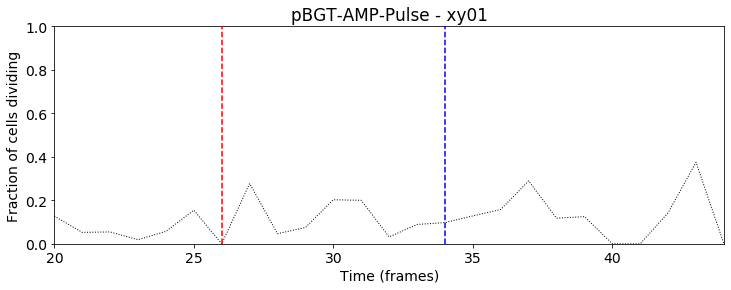

667
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy02.png


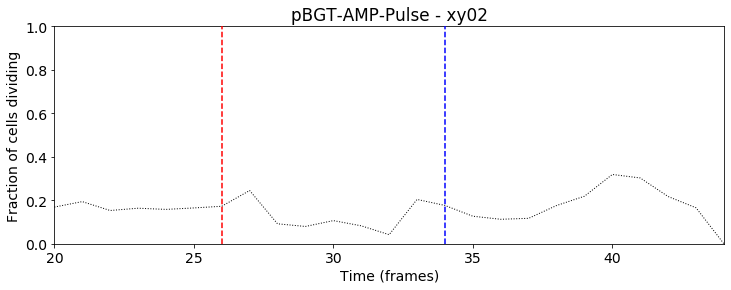

430
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy03.png


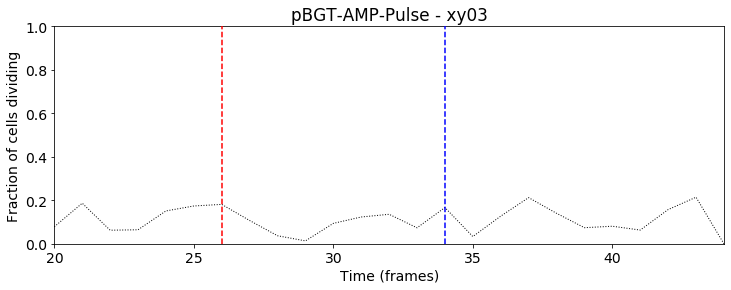

781
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy11.png


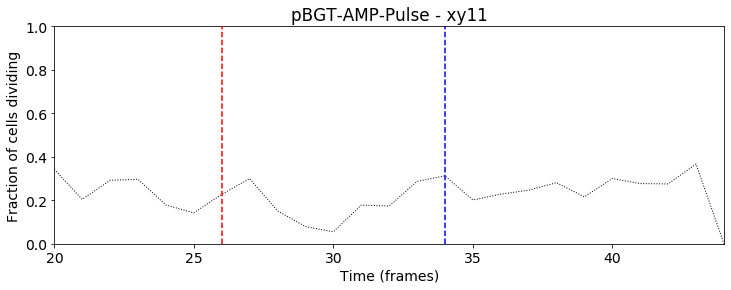

1342
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy12.png


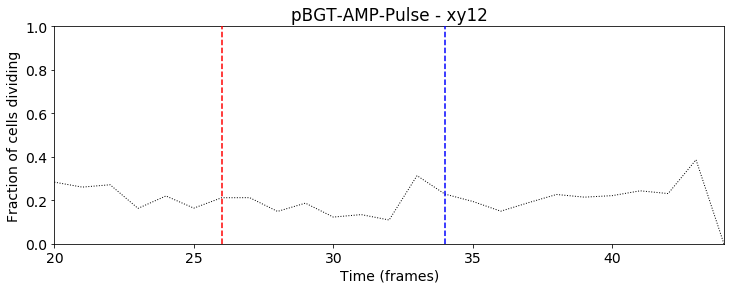

355
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy13.png


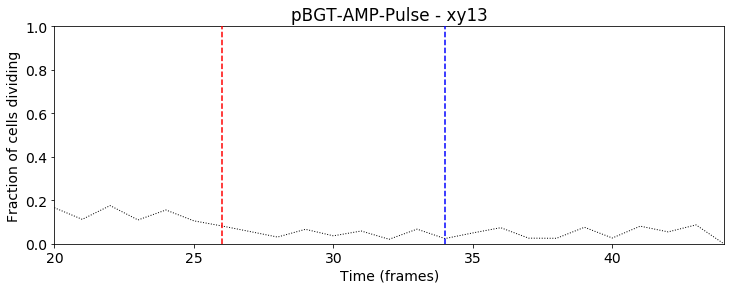

373
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy14.png


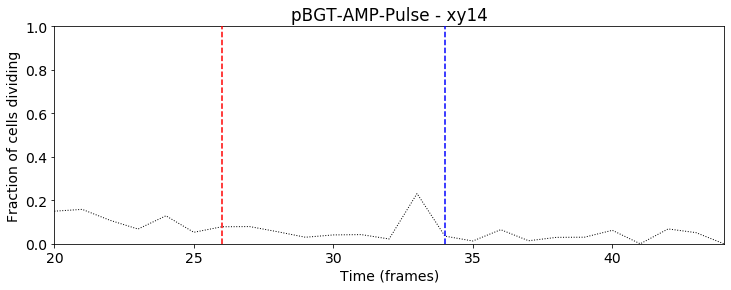

232
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy20.png


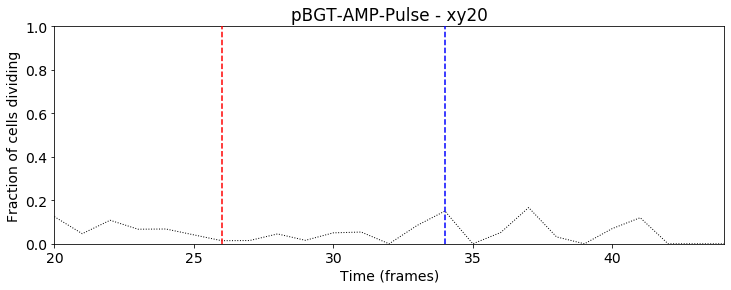

329
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy21.png


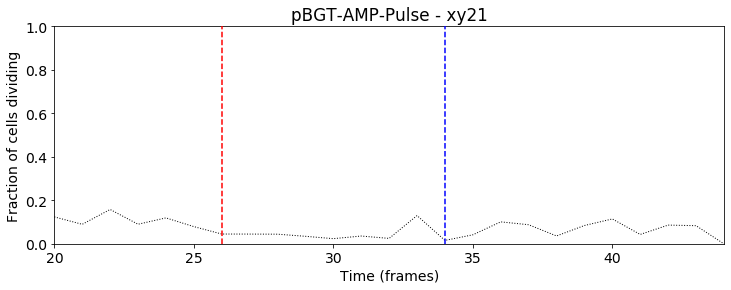

459
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy22.png


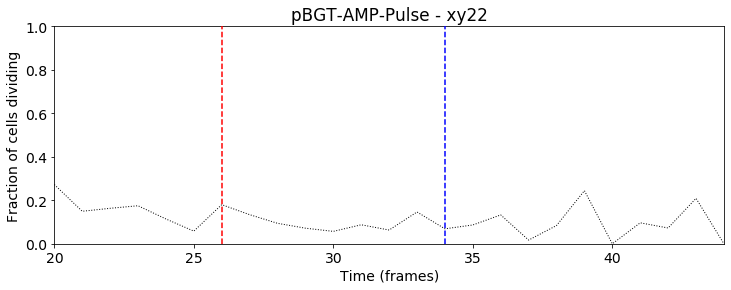

754
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy23.png


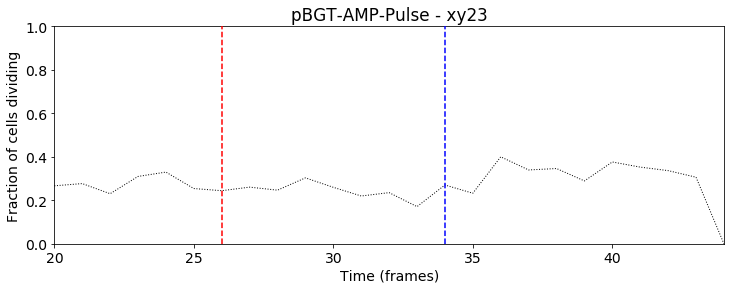

249
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy25.png


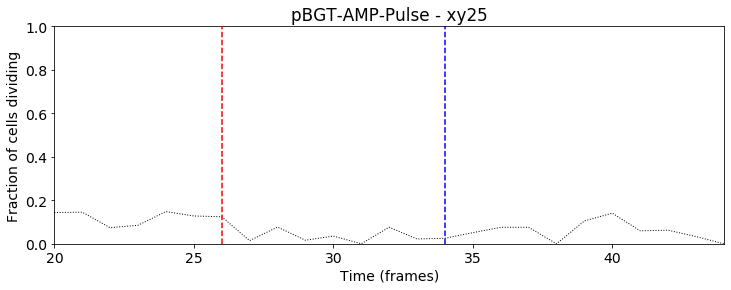

246
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy26.png


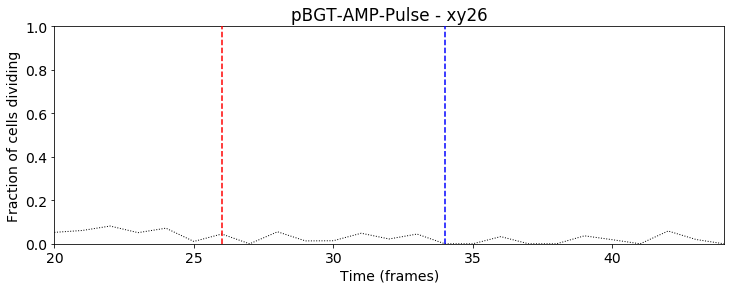

337
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy27.png


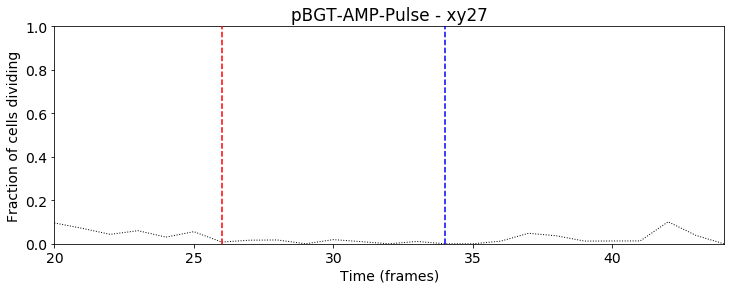

369
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy28.png


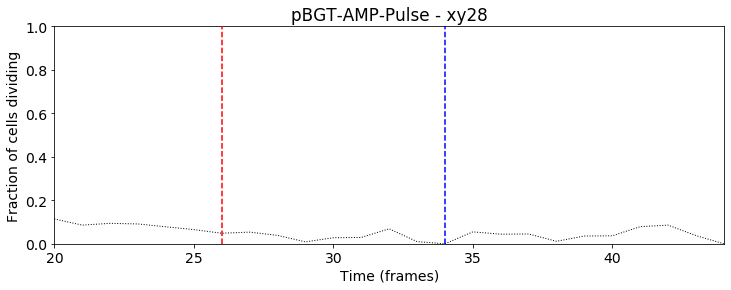

313
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy29.png


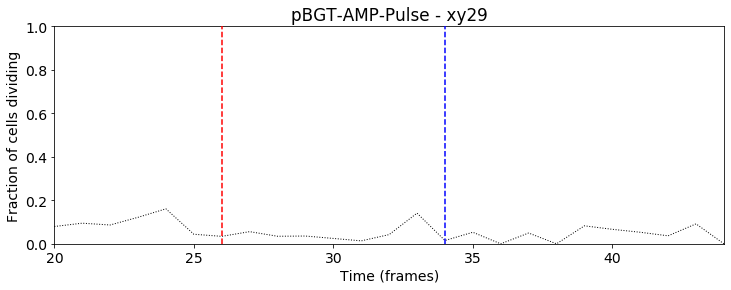

338
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy30.png


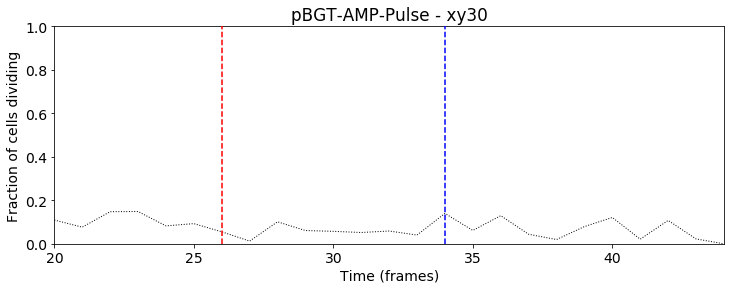

572
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy33.png


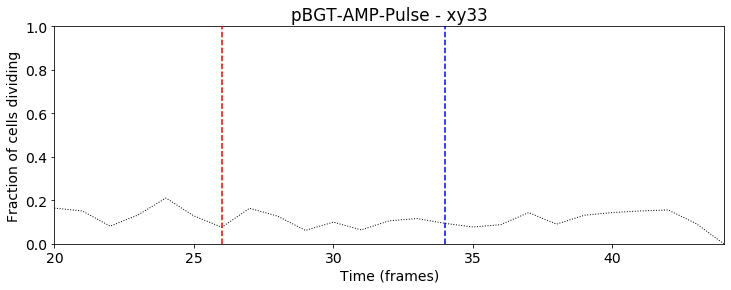

1417
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy34.png


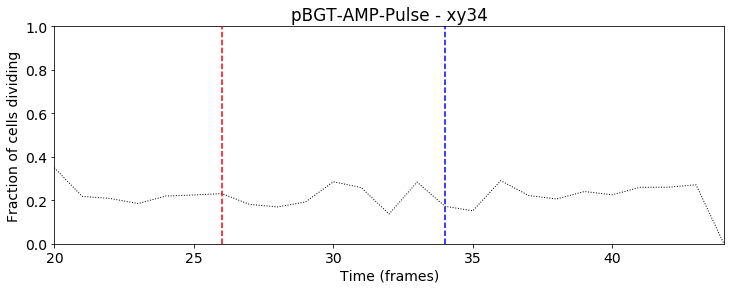

793
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy35.png


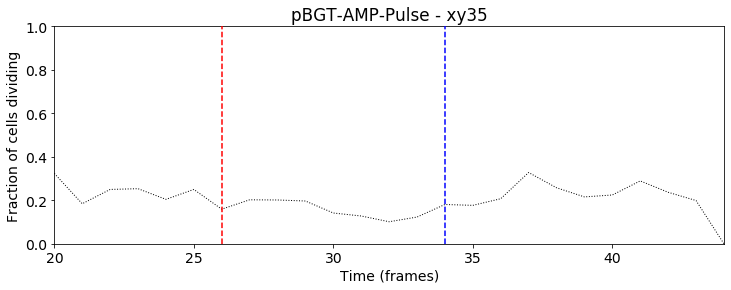

442
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy36.png


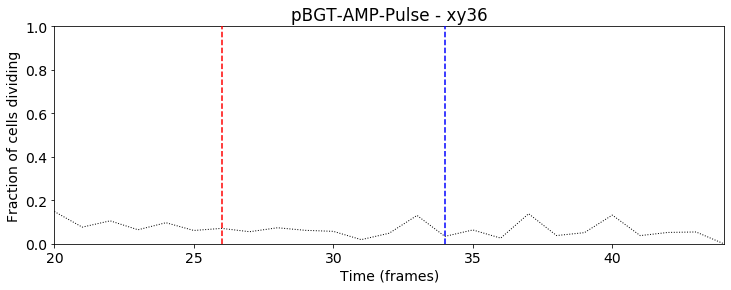

481
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy37.png


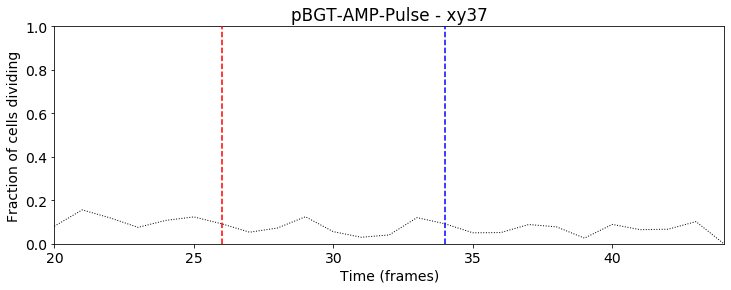

417
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy39.png


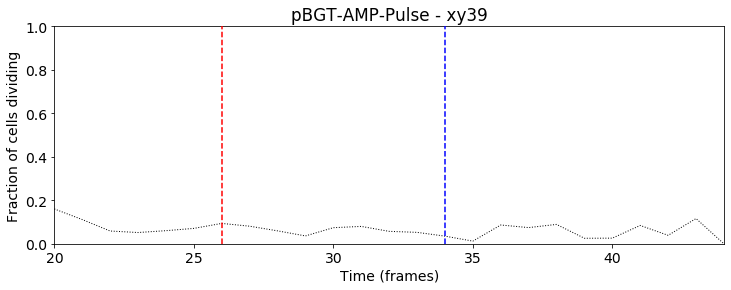

233
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy40.png


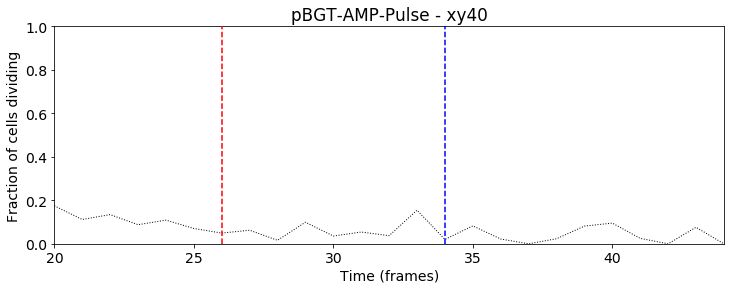

420
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy41.png


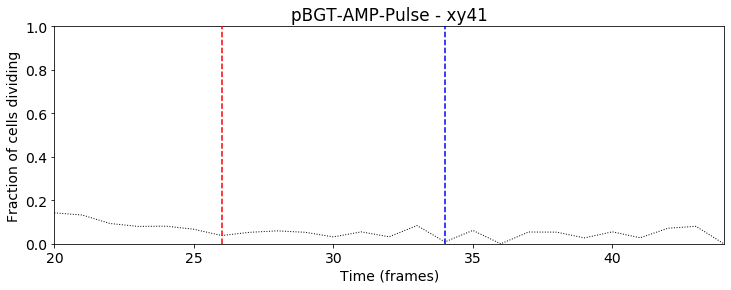

442
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy42.png


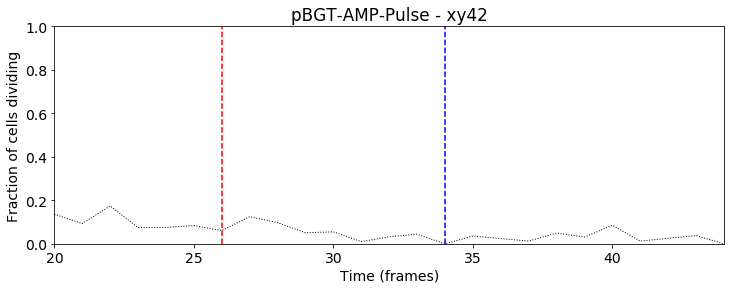

358
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy43.png


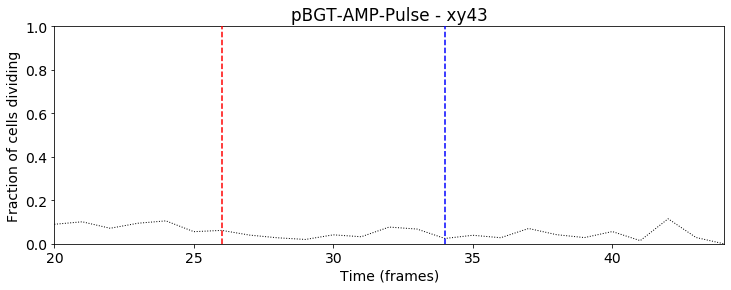

292
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy44.png


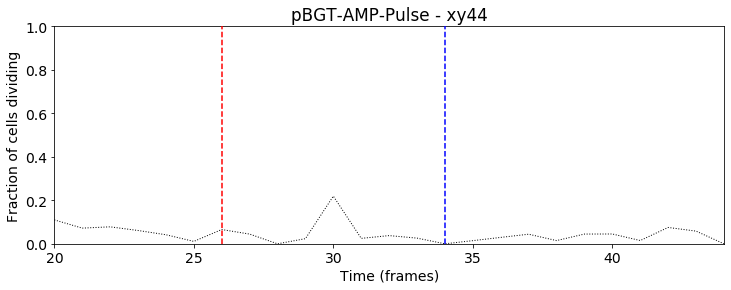

386
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy45.png


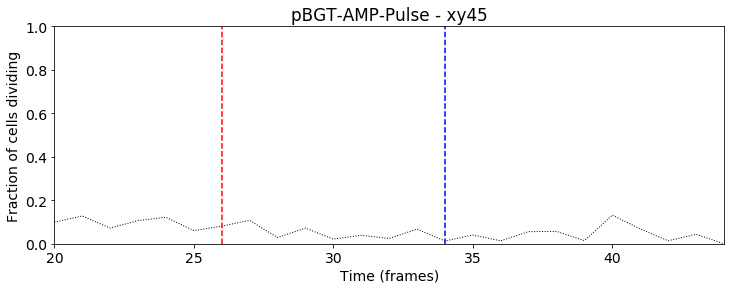

784
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy46.png


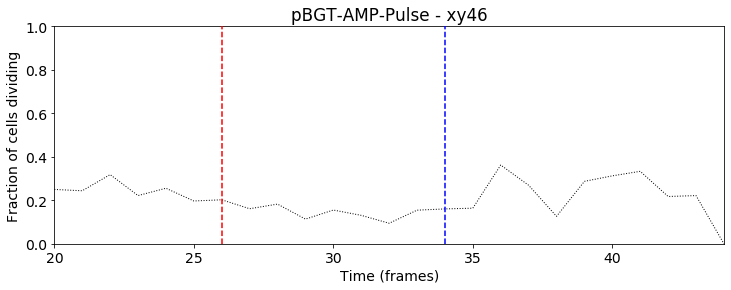

403
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_divisions_timeseries_xy47.png


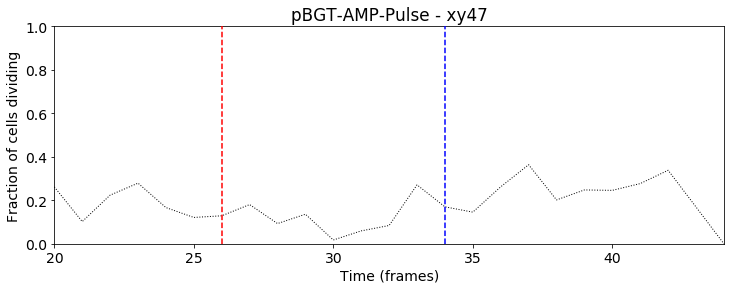

In [13]:
max_frames=frame_experiment_end-frame_experiment_start
minFrames=max_frames-5

print(max_frames,minFrames)
for i,trap in enumerate(trap_list):
    
    this_lineages=trap_lineages[i]
    #this_lineages=get_long_lineages(this_lineages, minFrames)
    print(len(this_lineages))
    
    mpl.rcParams.update({'font.size': 14})
    data_labels={'divisions'}
    for this_data_label in data_labels:
        #fileName="%s%s_%s_timeseries_%s.png"%(dirNameTimeSeries_Imgs,expeLabel,trap,this_data_label)
        fileName="%s%s_%s_timeseries_%s.png"%(dirNameTimeSeries_Imgs,expeLabel,this_data_label,trap)
        print(fileName)
        title="%s - %s"%(expeLabel,trap)
        fig=plot_cells_data_divs(this_lineages, this_data_label, fileName,frame_signal_start,frame_signal_end,frame_experiment_start, frame_experiment_end,frames_list,title)
            
        plt.show()


### Cells length

24 22
/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy01.png


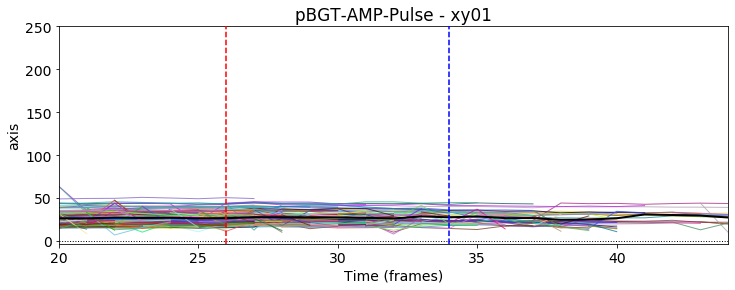

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy02.png


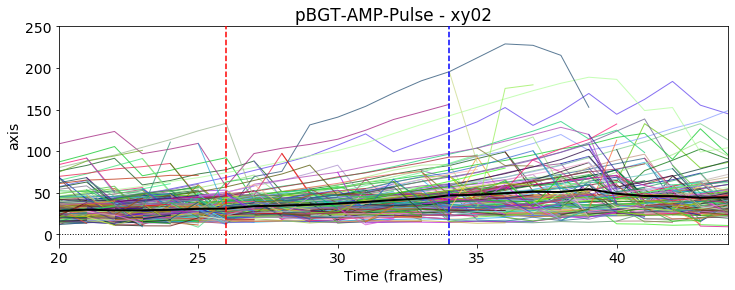

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy03.png


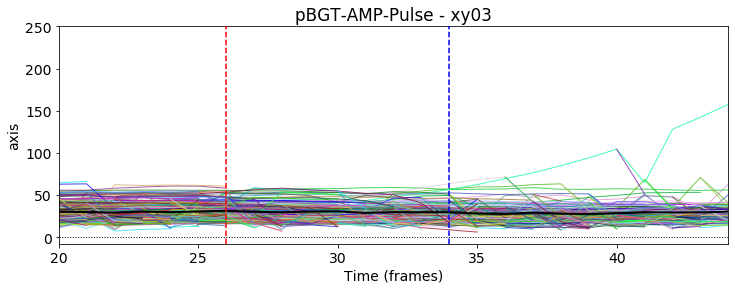

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy11.png


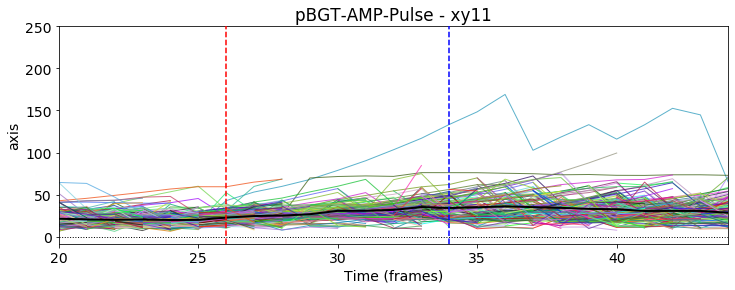

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy12.png


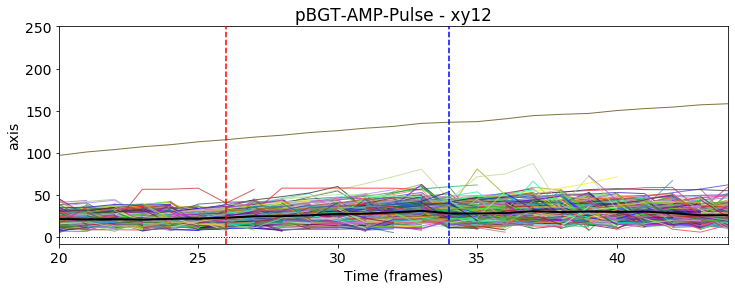

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy13.png


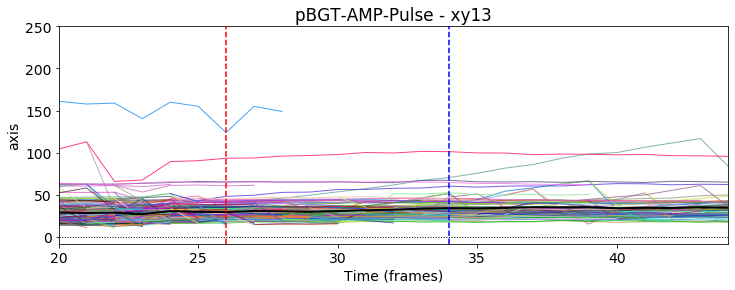

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy14.png


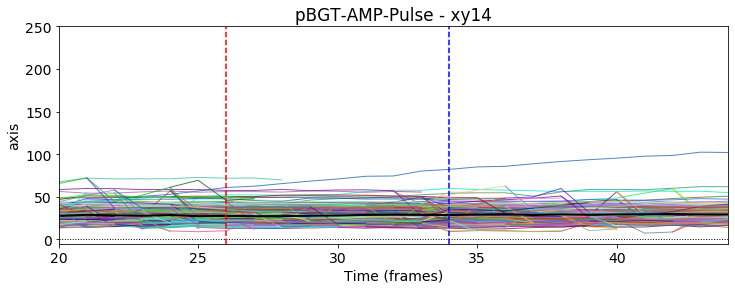

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy20.png


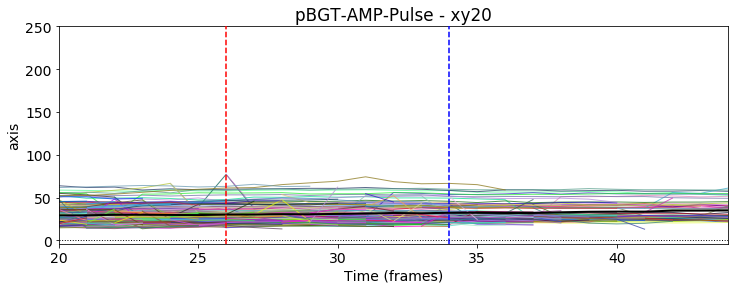

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy21.png


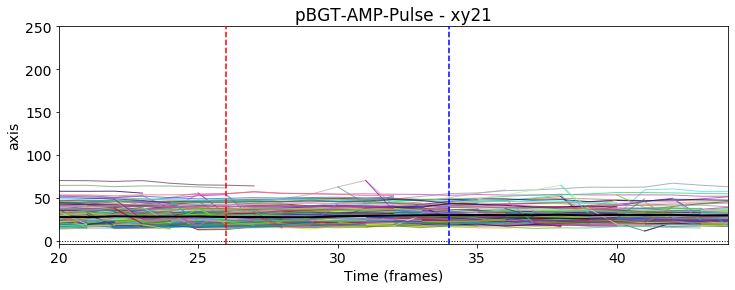

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy22.png


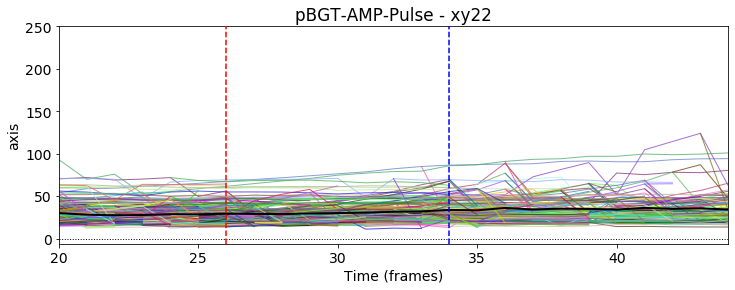

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy23.png


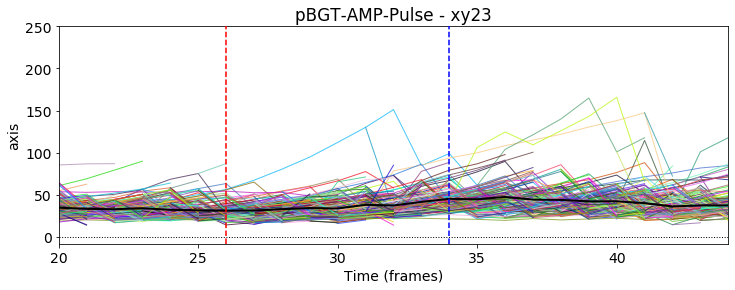

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy25.png


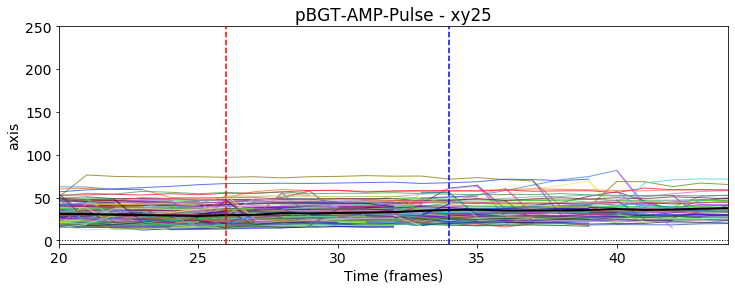

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy26.png


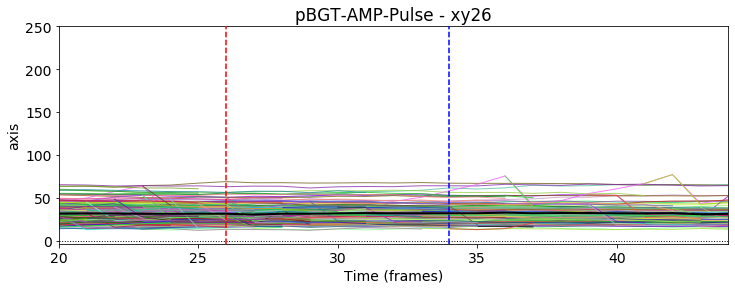

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy27.png


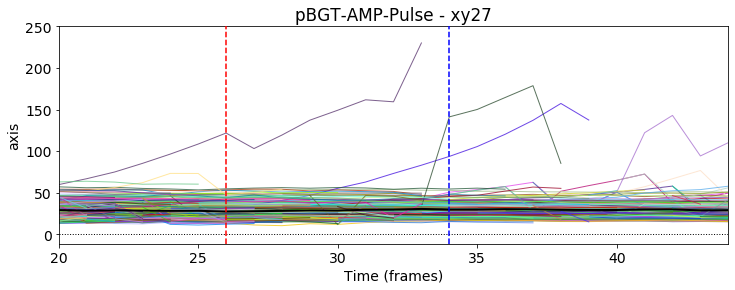

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy28.png


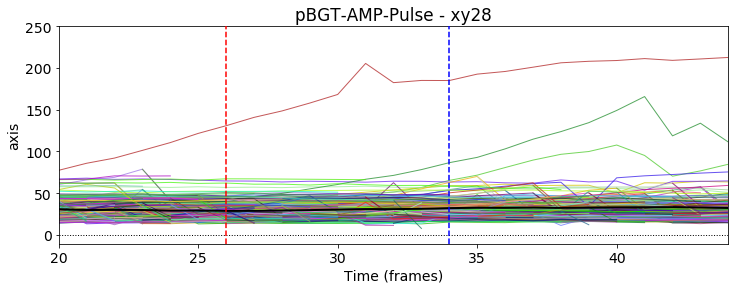

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy29.png


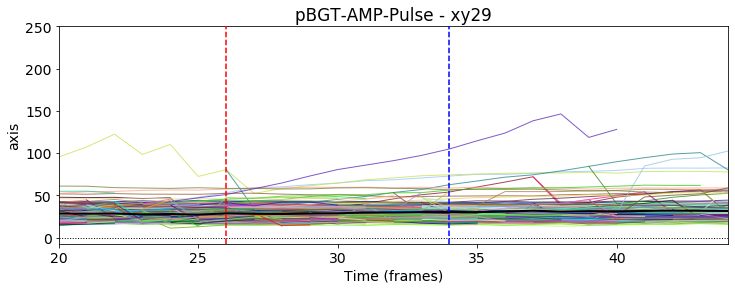

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy30.png


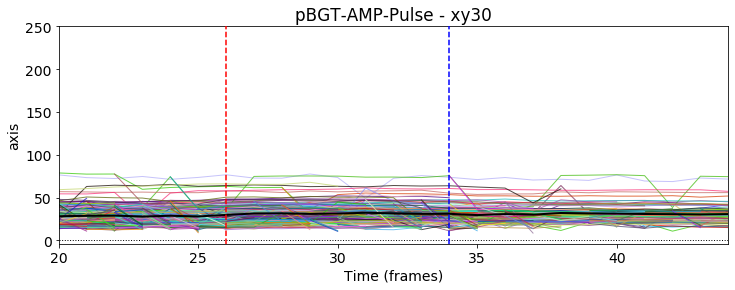

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy33.png


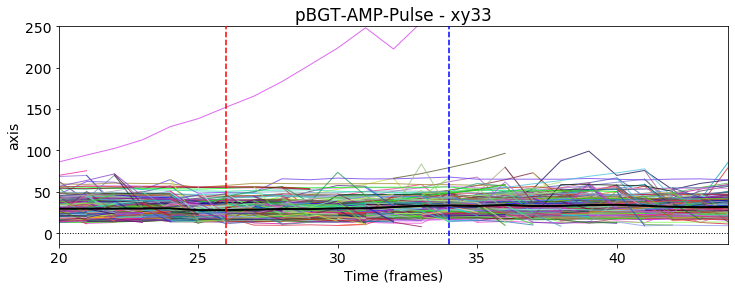

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy34.png


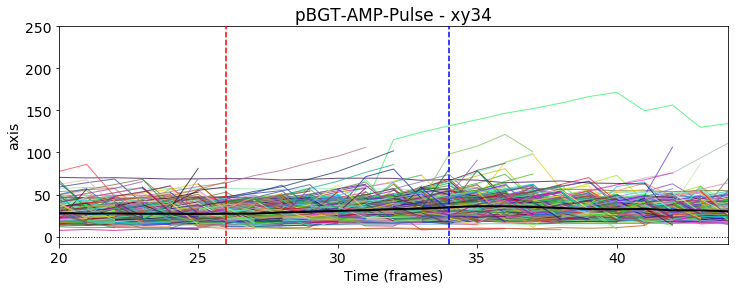

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy35.png


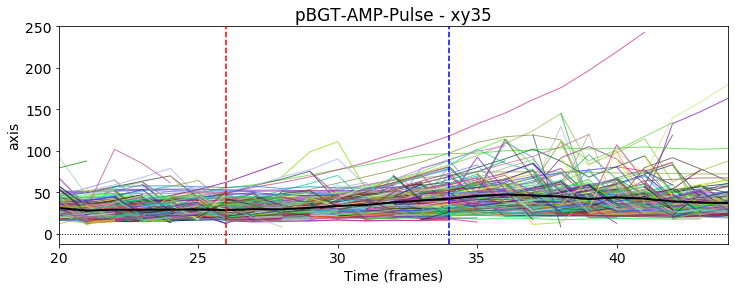

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy36.png


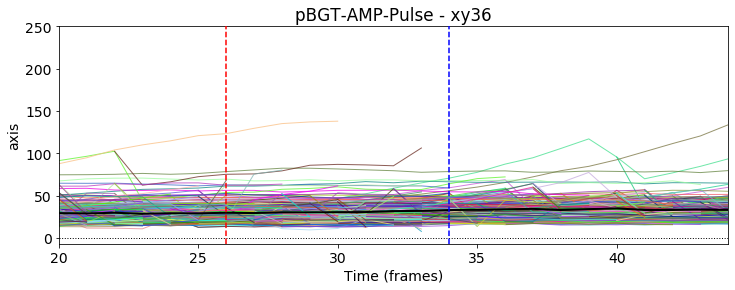

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy37.png


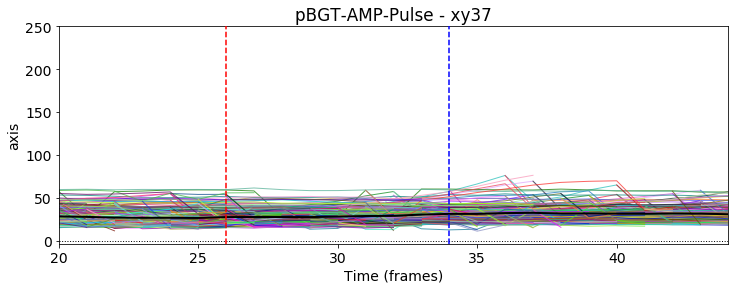

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy39.png


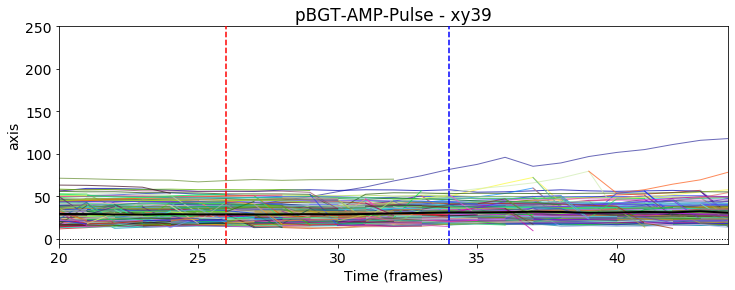

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy40.png


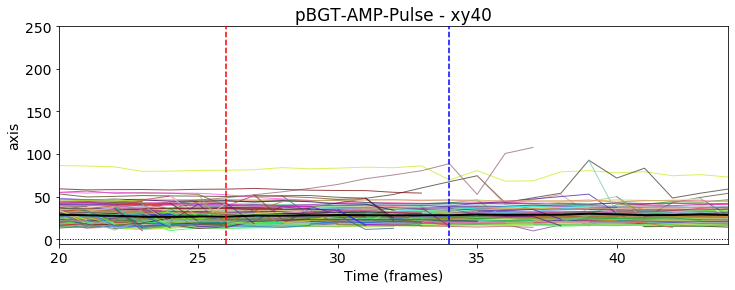

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy41.png


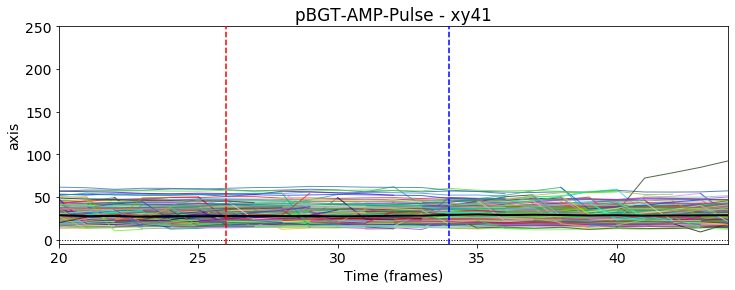

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy42.png


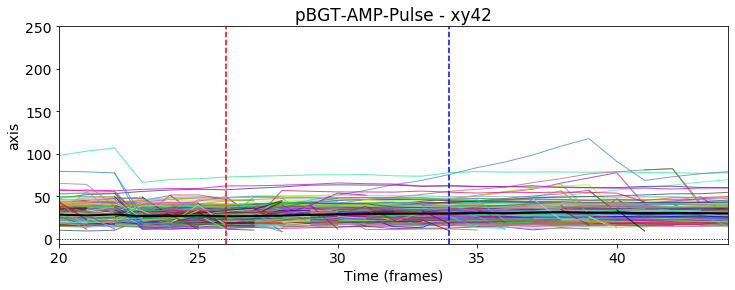

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy43.png


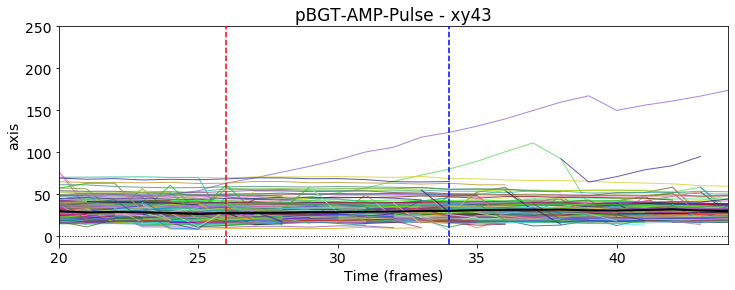

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy44.png


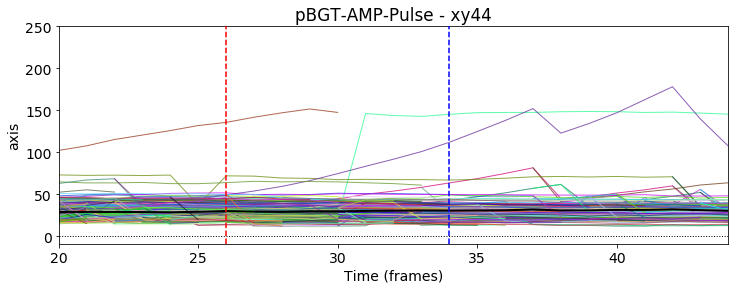

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy45.png


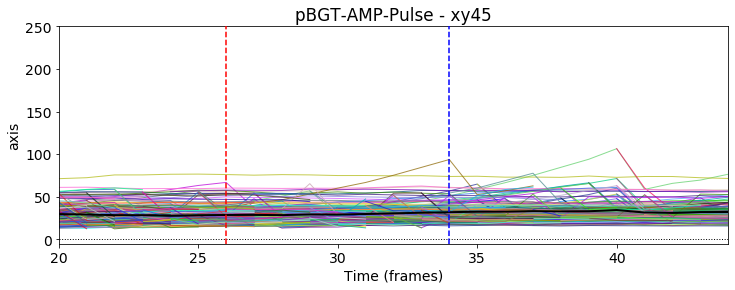

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy46.png


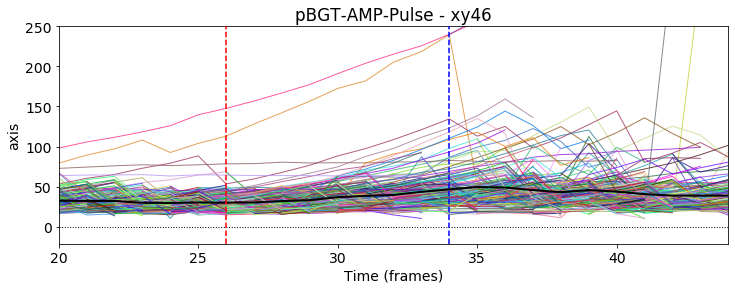

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_axis_timeseries_xy47.png


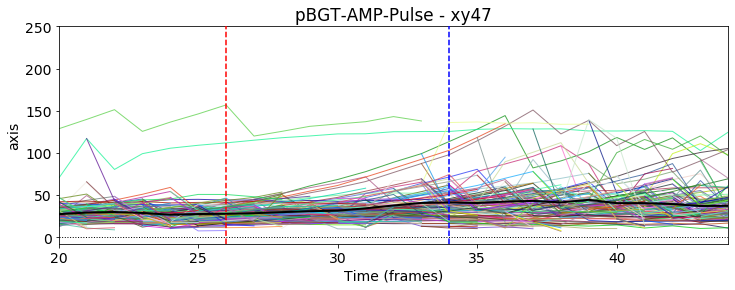

In [14]:
max_frames=frame_experiment_end-frame_experiment_start
minFrames=max_frames-2

length_threshold=250
print(max_frames,minFrames)
ylim=length_threshold
for i,trap in enumerate(trap_list):
    #print(trap)
    this_lineages=trap_lineages[i]
    #this_lineages=get_long_lineages(this_lineages, minFrames)
    nl=[]
    
    for lineage in this_lineages:
        if(lineage['axis'][0].length<length_threshold):
            nl.append(lineage)
            
    this_lineages=nl
    
   # this_lineages=random.sample(this_lineages,k=10)
    
    mpl.rcParams.update({'font.size': 14})
    data_labels={'axis'}
    for this_data_label in data_labels:
        #fileName="%s%s_%s_timeseries_%s.png"%(dirNameTimeSeries_Imgs,expeLabel,trap,this_data_label)
        fileName="%s%s_%s_timeseries_%s.png"%(dirNameTimeSeries_Imgs,expeLabel,this_data_label,trap)
        print(fileName)
        title="%s - %s"%(expeLabel,trap)
        fig=plot_cells_data_axis(this_lineages, this_data_label, fileName,frame_signal_start,frame_signal_end,frame_experiment_start, title,ylim)
        plt.show()

In [ ]:
for i,trap in enumerate(trap_list):
    
    this_lineages=trap_lineages[i]
    mpl.rcParams.update({'font.size': 14})
    data_labels={'GFP','DsRed'}
    for this_data_label in data_labels:
        fileName="%s%s_%s_timeseries_%s.png"%(dirNameTimeSeries_Imgs,expeLabel,this_data_label,trap)
        plot_cells_data(this_lineages, this_data_label, fileName)
        plt.show()





### Poincare

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy01.png


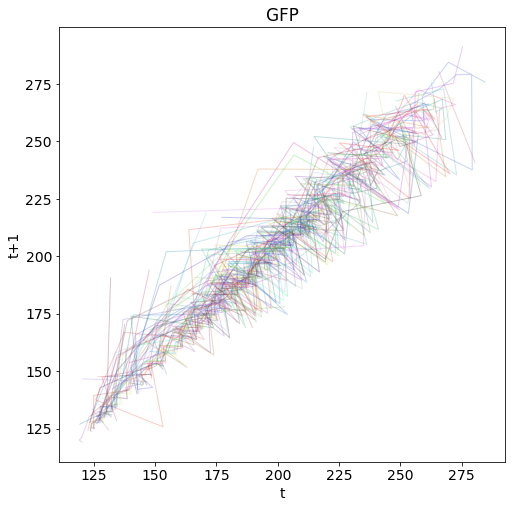

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy01.png


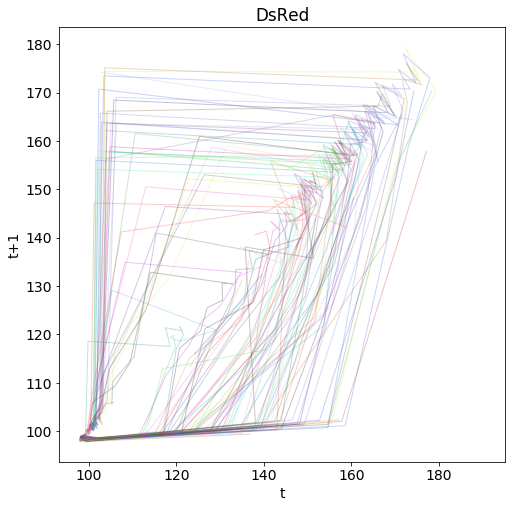

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy02.png


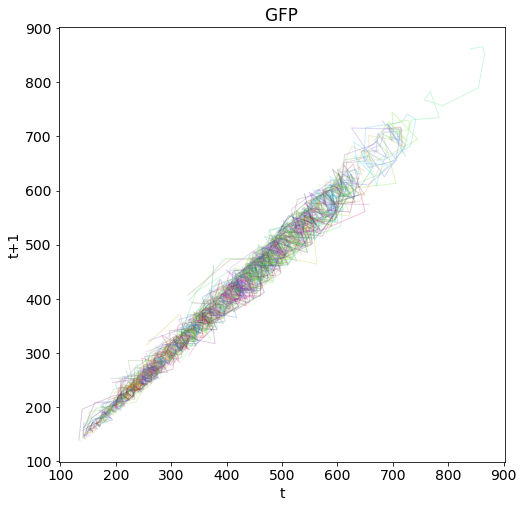

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy02.png


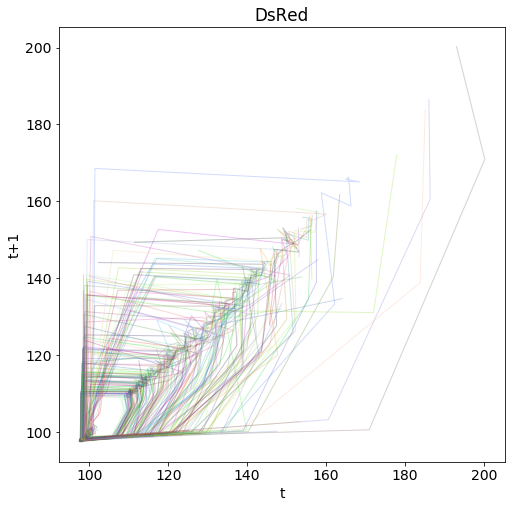

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy03.png


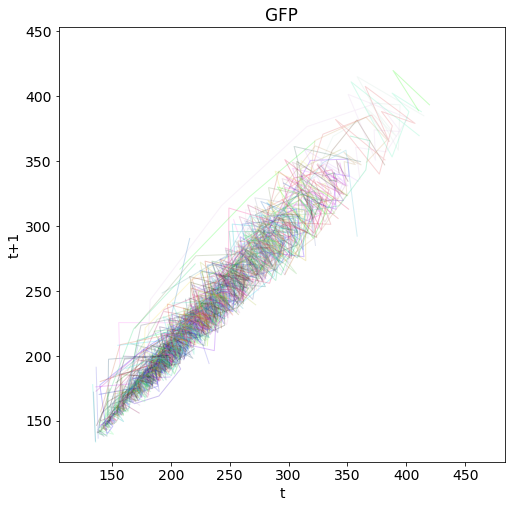

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy03.png


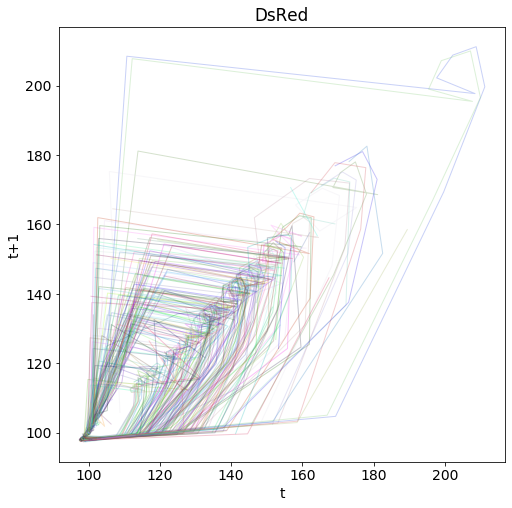

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy11.png


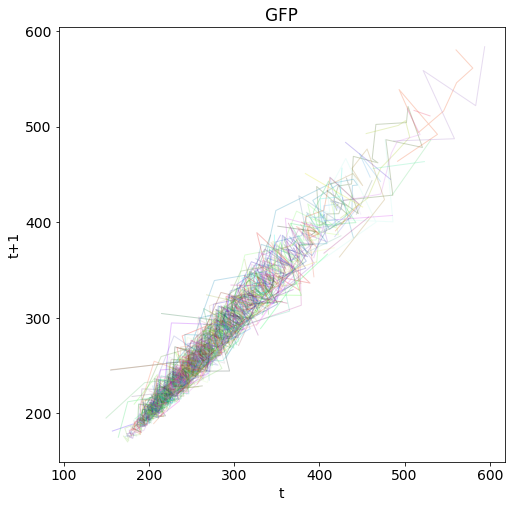

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy11.png


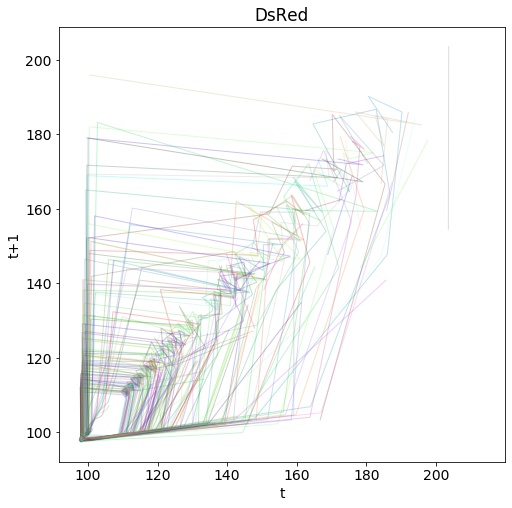

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy12.png


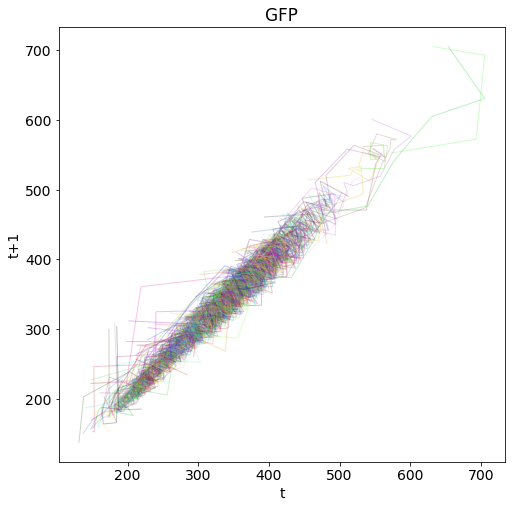

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy12.png


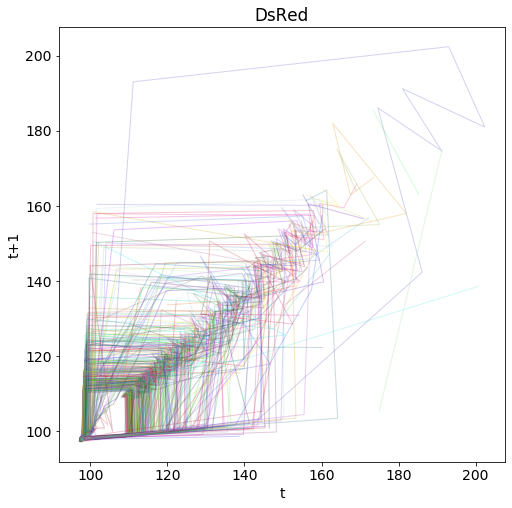

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy13.png


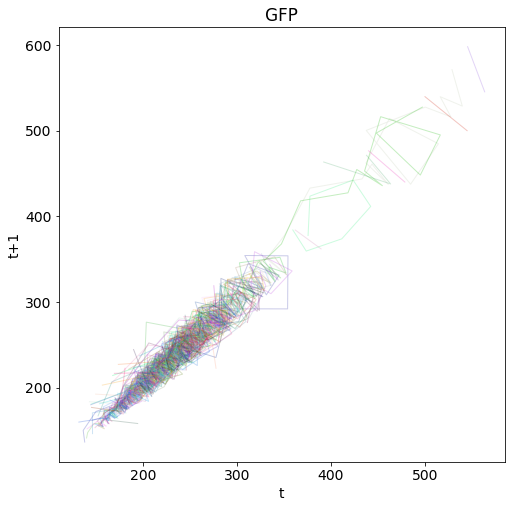

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy13.png


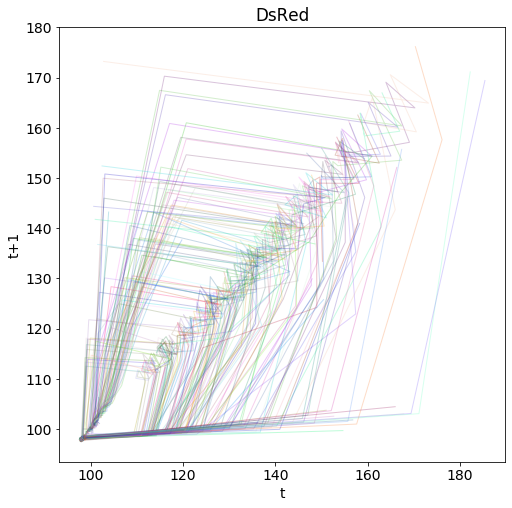

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy14.png


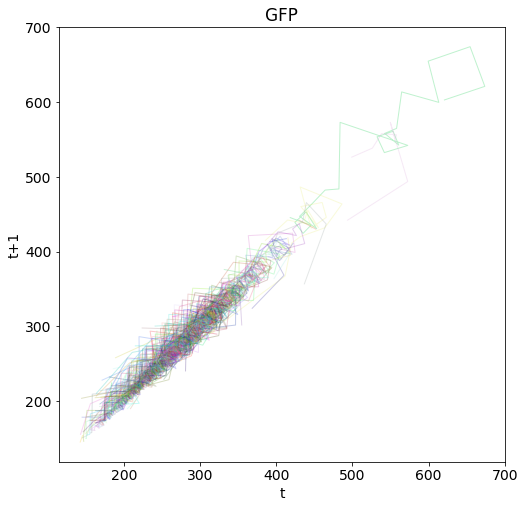

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy14.png


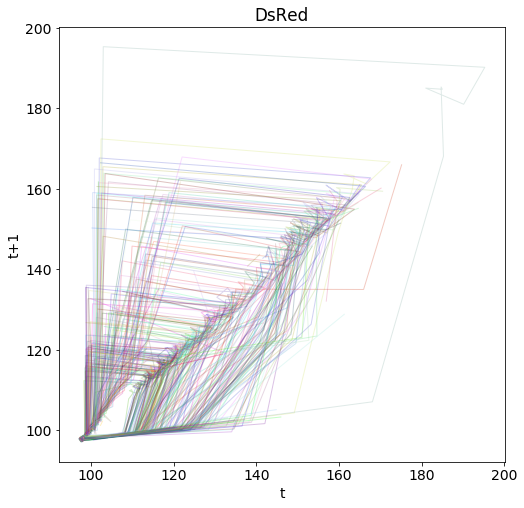

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy20.png


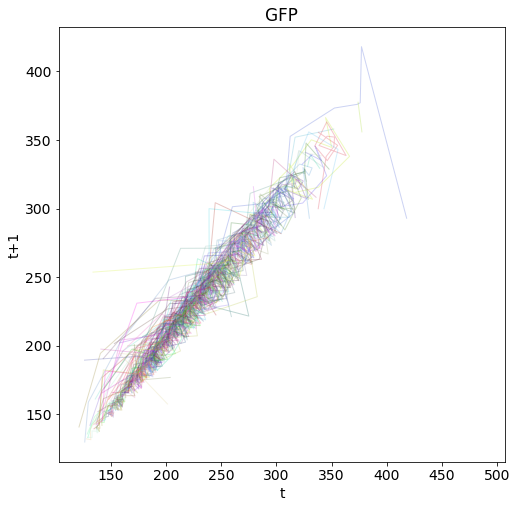

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy20.png


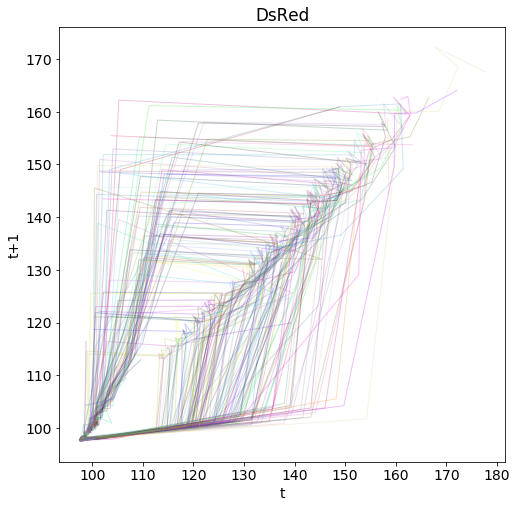

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy21.png


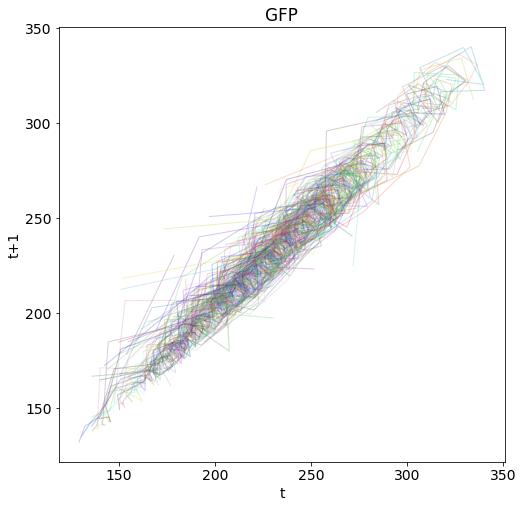

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy21.png


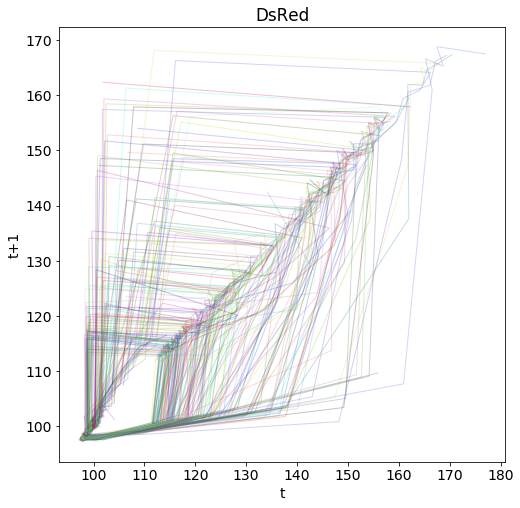

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy22.png


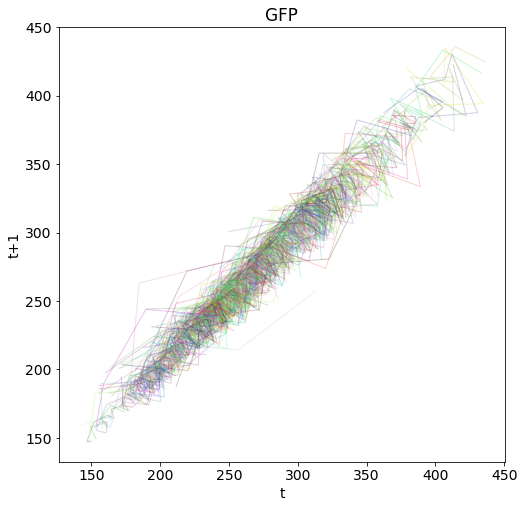

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy22.png


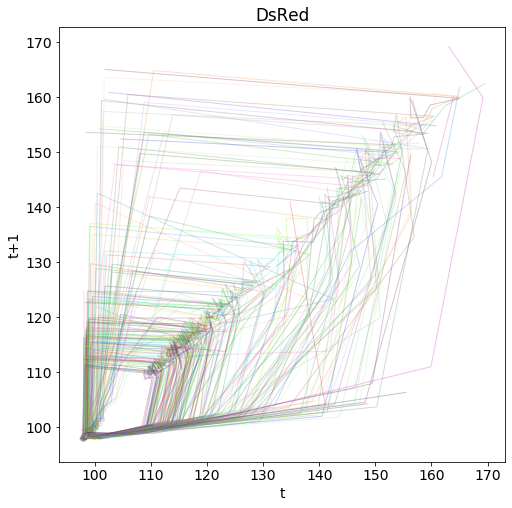

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy23.png


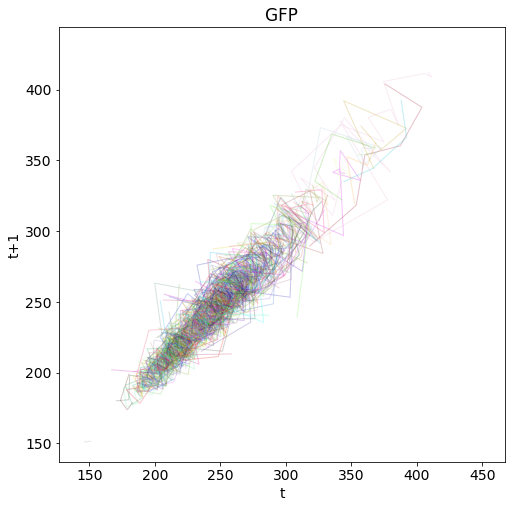

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy23.png


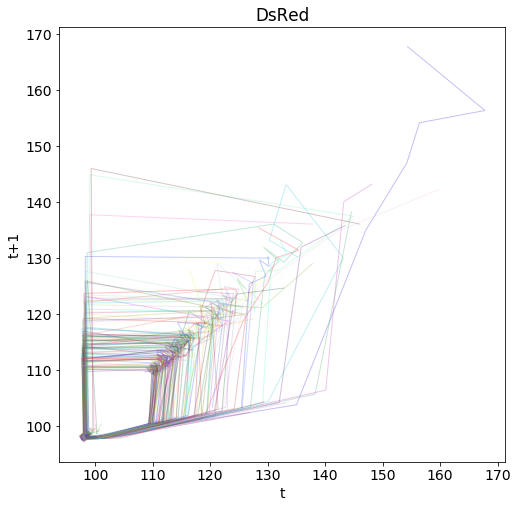

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy25.png


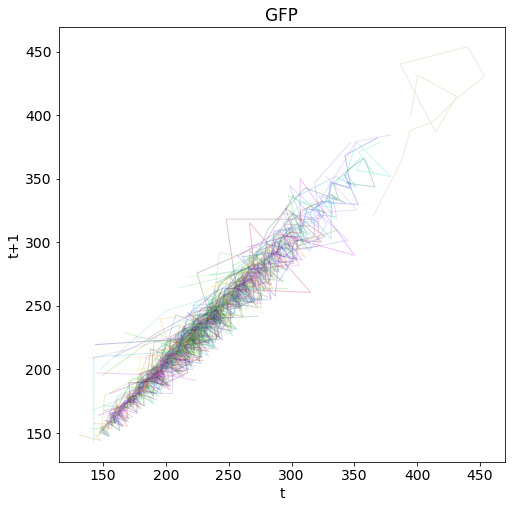

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy25.png


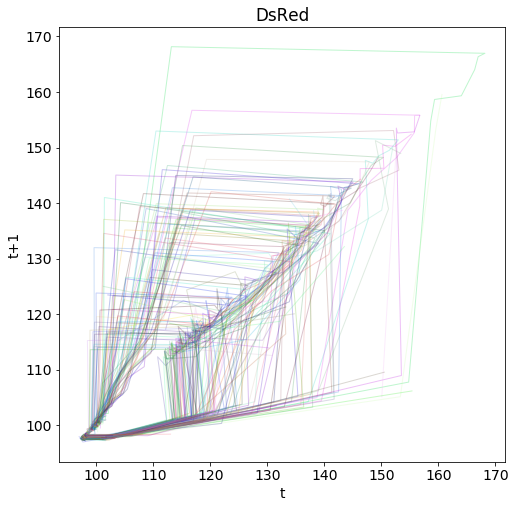

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy26.png


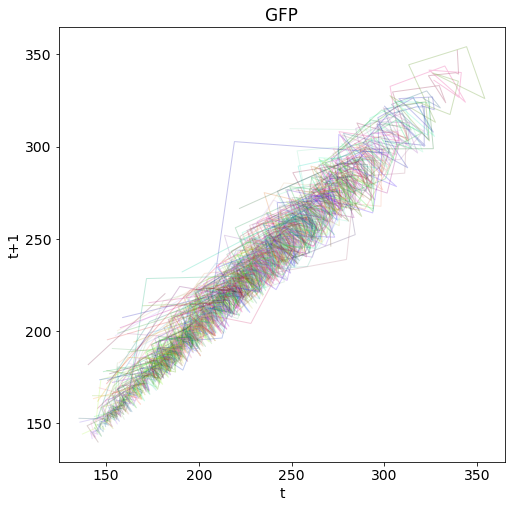

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy26.png


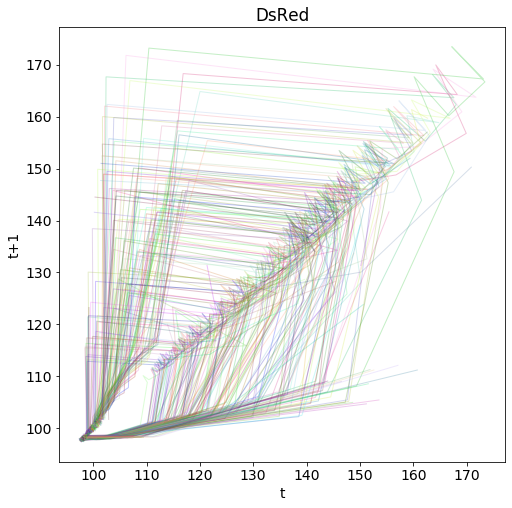

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy27.png


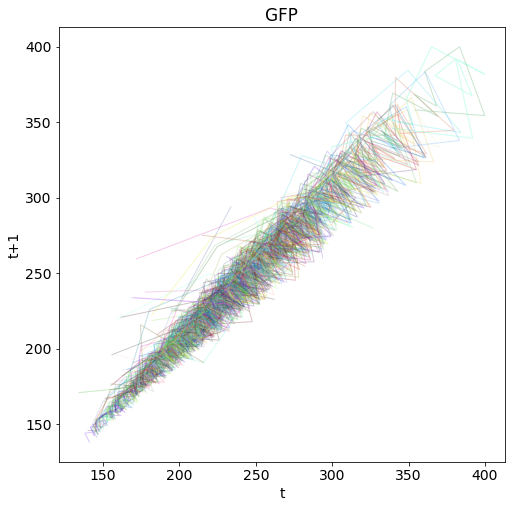

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy27.png


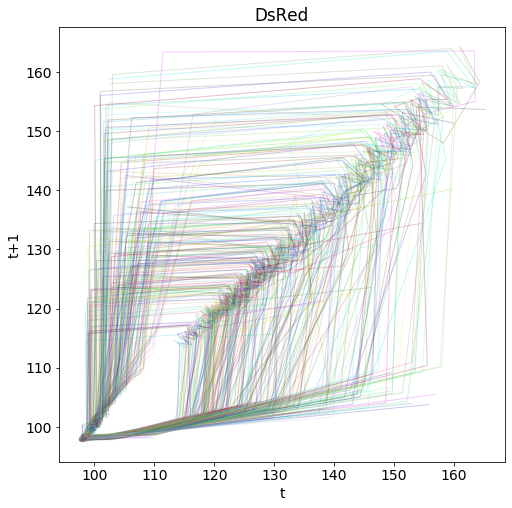

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy28.png


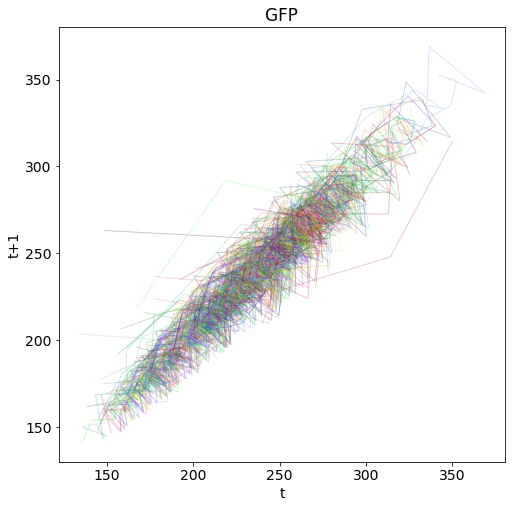

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy28.png


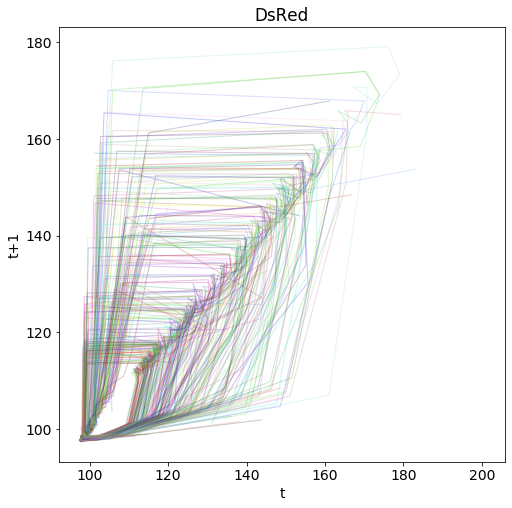

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy29.png


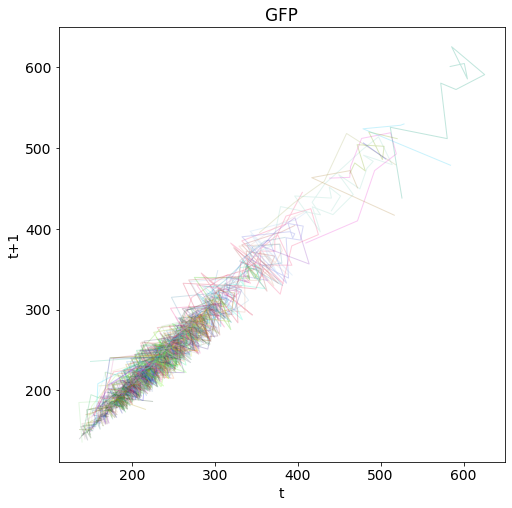

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy29.png


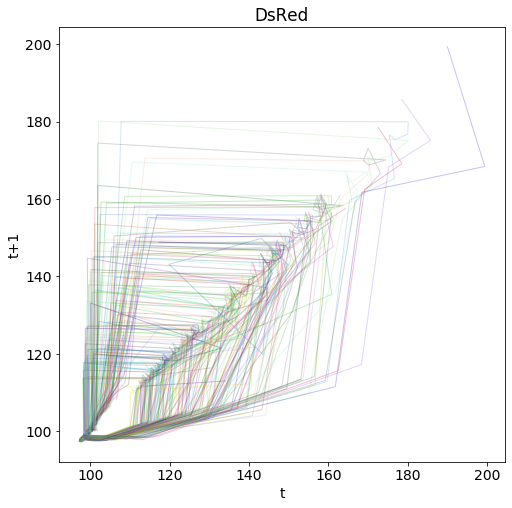

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy30.png


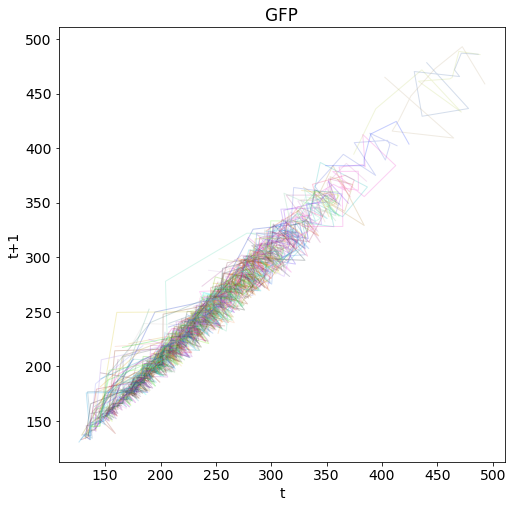

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy30.png


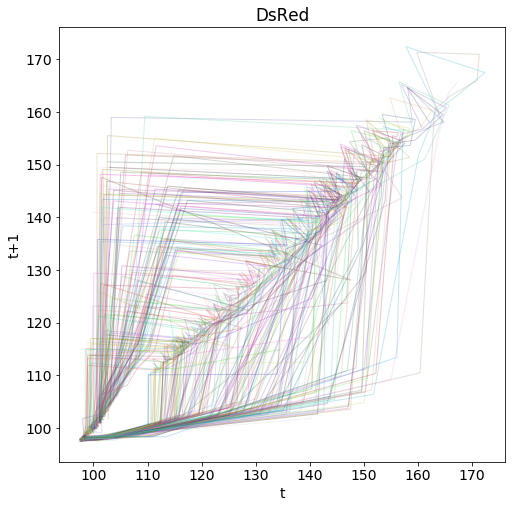

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy33.png


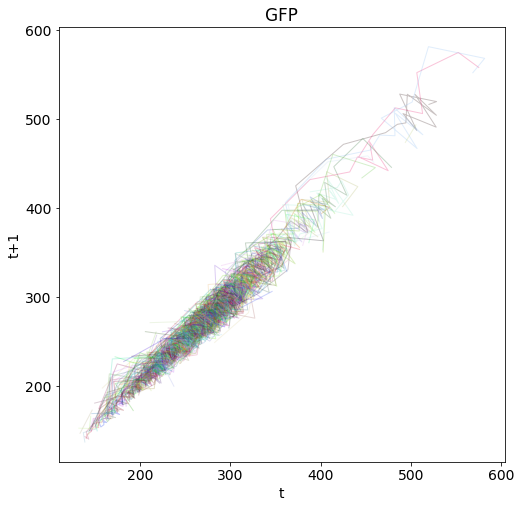

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy33.png


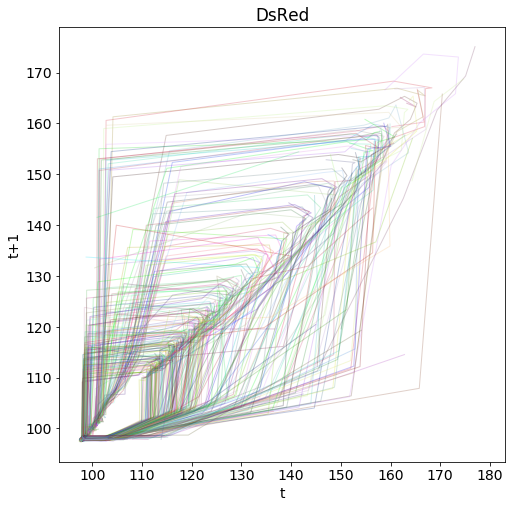

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy34.png


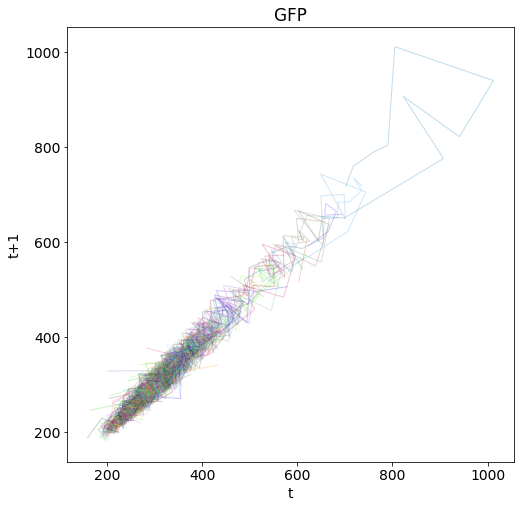

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy34.png


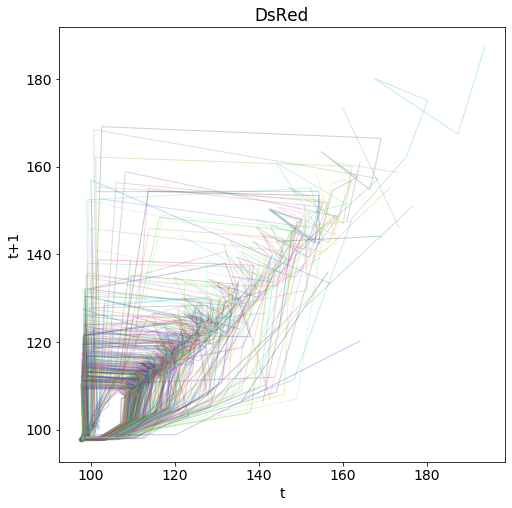

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy35.png


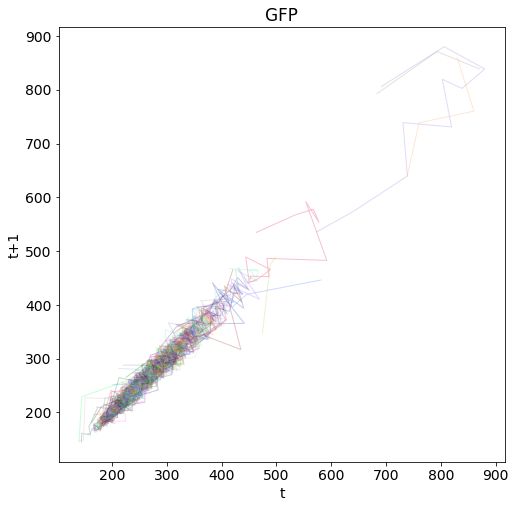

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy35.png


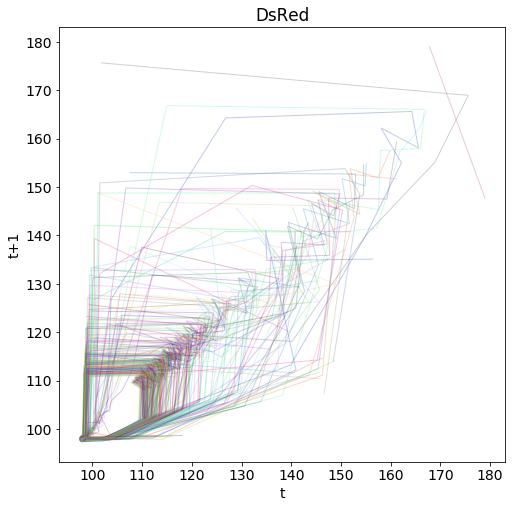

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy36.png


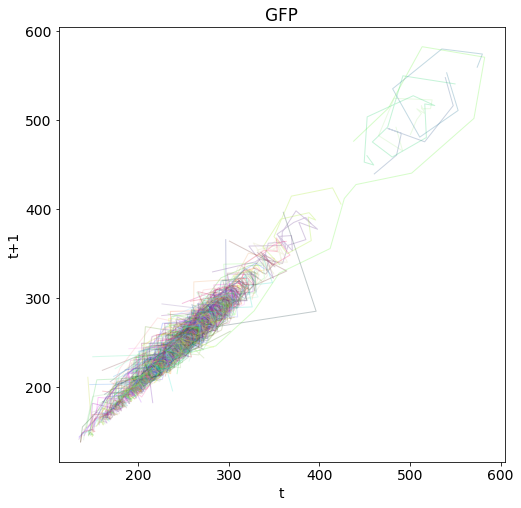

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy36.png


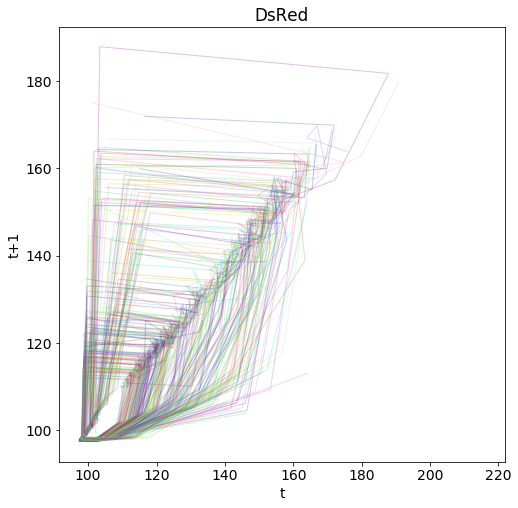

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy37.png


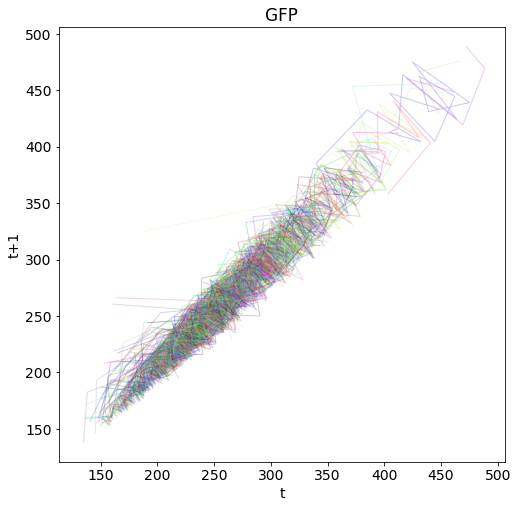

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy37.png


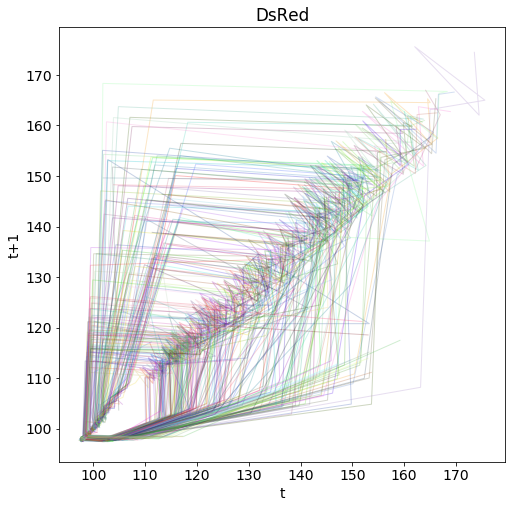

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy39.png


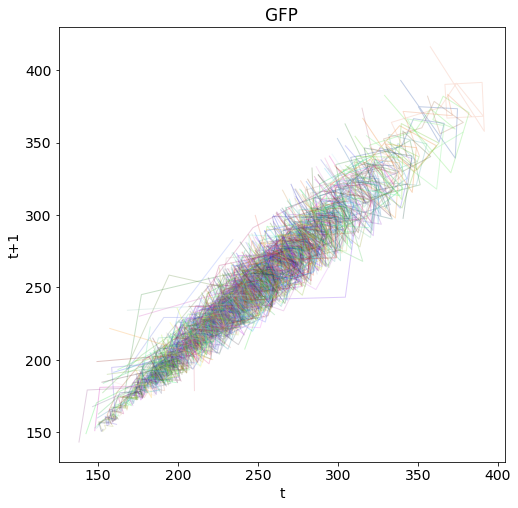

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy39.png


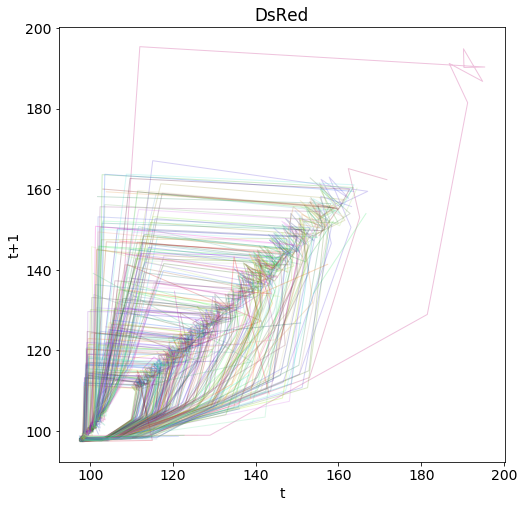

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy40.png


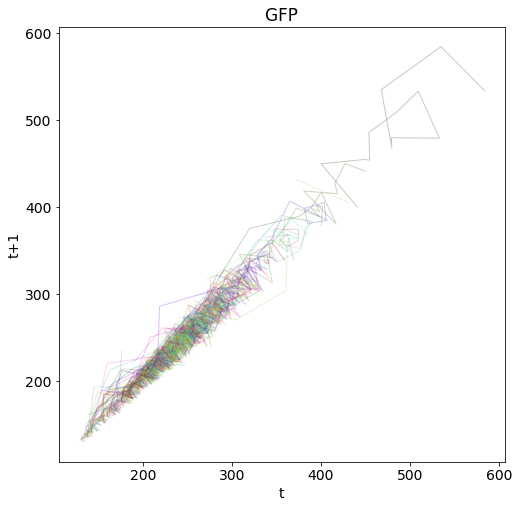

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy40.png


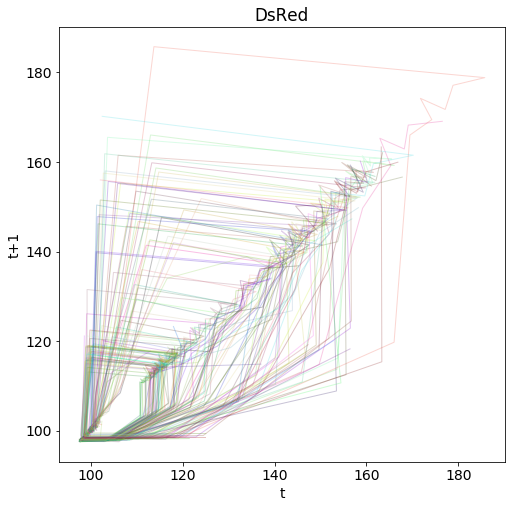

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy41.png


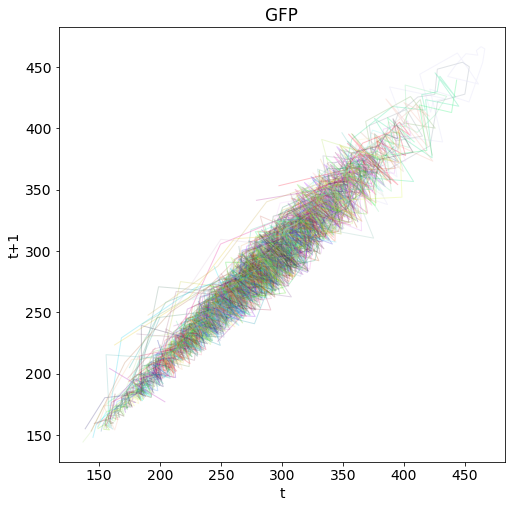

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy41.png


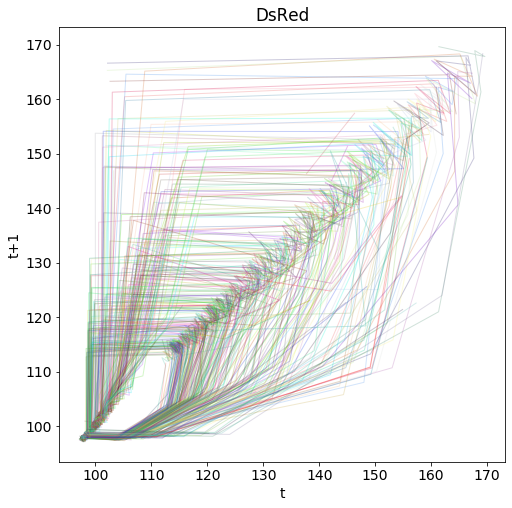

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy42.png


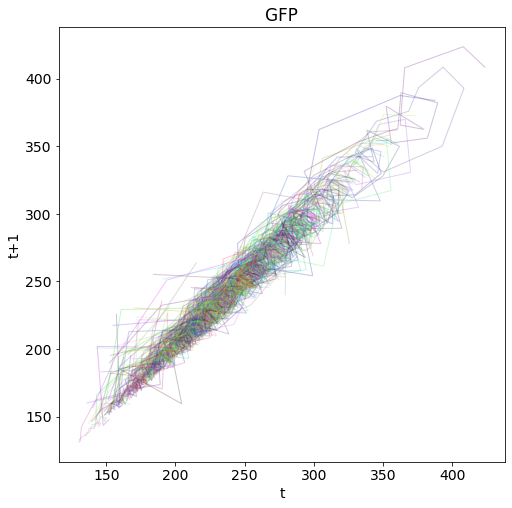

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy42.png


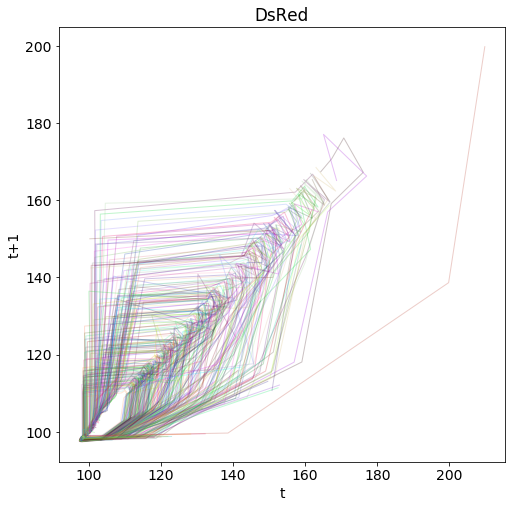

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy43.png


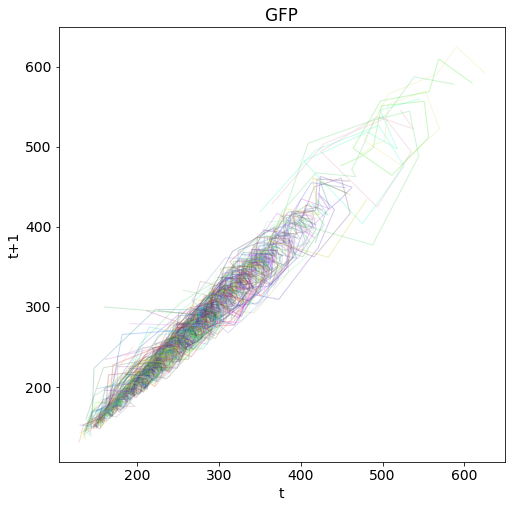

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy43.png


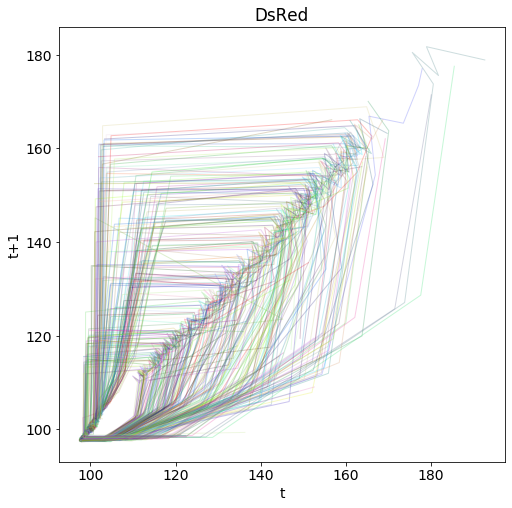

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy44.png


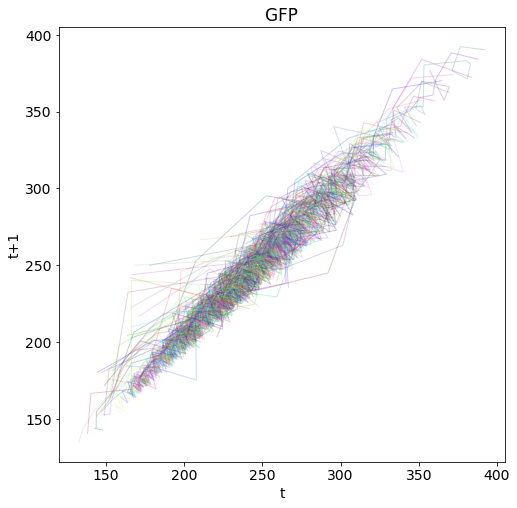

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy44.png


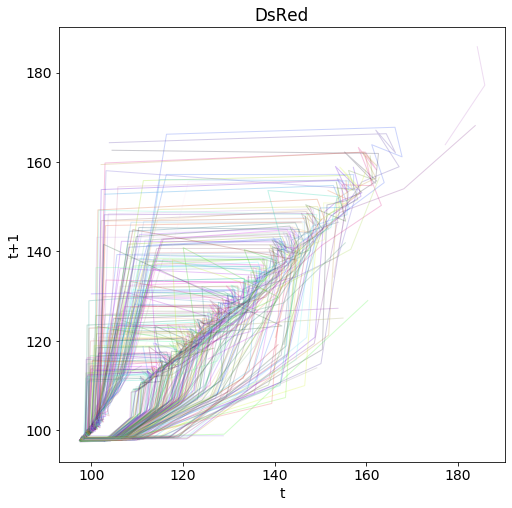

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy45.png


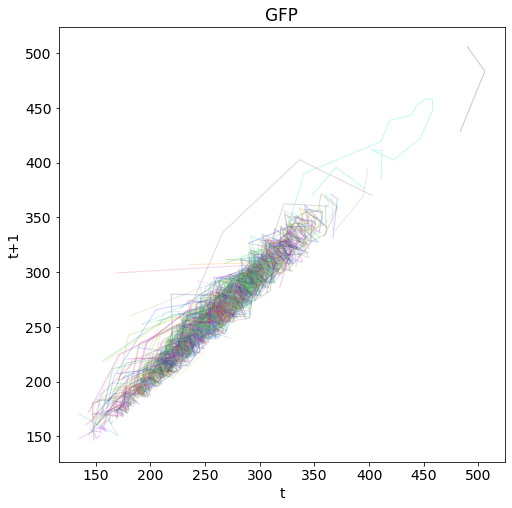

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy45.png


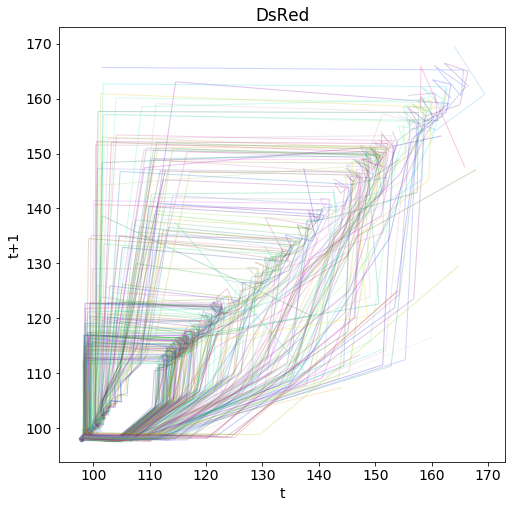

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy46.png


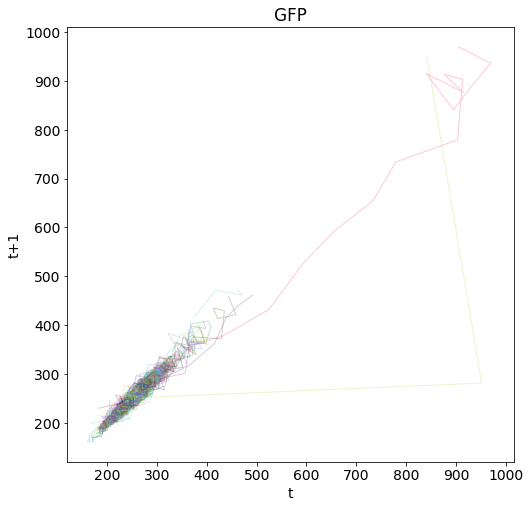

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy46.png


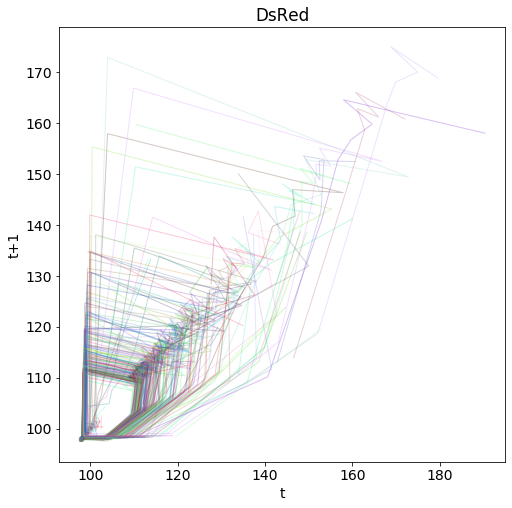

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_GFP_poincare_xy47.png


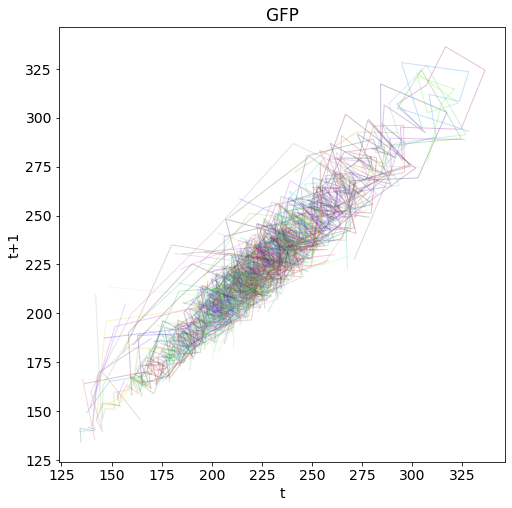

/home/charly/Lab/Projects/uJ/uJ_data/pBGT-AMP-Pulse/20190325_Bruno_pBGT_quimiostato/figures/lineages/time_series/pBGT-AMP-Pulse_DsRed_poincare_xy47.png


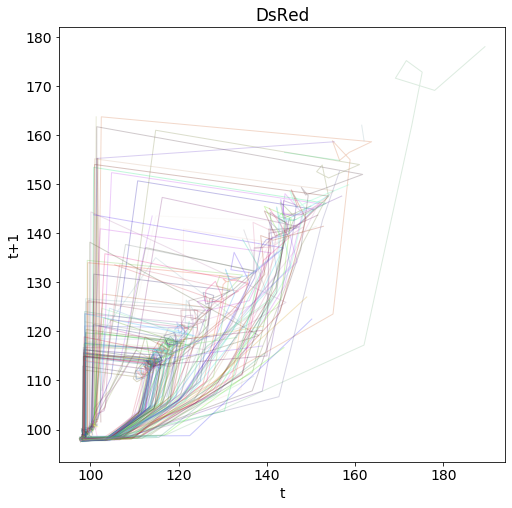

In [15]:
    
mpl.rcParams.update({'font.size': 14})
for i,trap in enumerate(trap_list):
    #print(trap)
    this_lineages=trap_lineages[i]

    data_labels={'GFP','DsRed'}
    for this_data_label in data_labels:
        fileName="%s%s_%s_poincare_%s.png"%(dirNameTimeSeries_Imgs,expeLabel,this_data_label,trap)
        print(fileName)
        plot_cells_poincare(this_lineages, this_data_label, fileName)
        plt.show()    
    

### Horizon Plots

In [ ]:


num_levels=4
max_frames=frame_experiment_end-frame_experiment_start
minFrames=max_frames-2

print(max_frames,minFrames)

for i,trap in enumerate(trap_list):
    #print(trap)
    this_lineages=trap_lineages[i]
    
    long_lineages=get_long_lineages(this_lineages, minFrames)
    #long_lineages=get_analysis_lineages(this_lineages, frame_signal_start,frame_experiment_end,frame_experiment_start)
    #long_lineages=long_lineages[0:5]
    print(len(long_lineages))
    fileName="%s%s_horizons_%s.png"%(dirNameTimeSeries_Imgs,expeLabel,trap)
    print(fileName)
    plot_NormGFP_Horizon(long_lineages, num_levels, fileName,frame_signal_start,frame_signal_end,frame_experiment_start)
    plt.show()
    plt.close()   

## Load Data & Plot layer

In [ ]:
trap_df_lineages_all=[]
trap_df_lineages_analysis=[]
for i,trap in enumerate(trap_list):
    cell_lineages=trap_lineages[i]
    dirNameDATALINEAGES=rootDir+'data/lineages/'
    lineagesDataFile='%s%s_%s_lineages_analysis.csv'%(dirNameDATALINEAGES, expeLabel, trap)
    df_lineages=load_data_lineages(lineagesDataFile)
    trap_df_lineages_analysis.append(df_lineages)
    list_frames_analysis=df_lineages.frame.unique()
    lineagesDataFile='%s%s_%s_lineages_all.csv'%(dirNameDATALINEAGES, expeLabel, trap)
    df_lineages=load_data_lineages(lineagesDataFile)
    trap_df_lineages_all.append(df_lineages)
    list_frames_all=df_lineages.frame.unique()

### Draw ROIs + Data Overlay (export to PNG)  

In [ ]:
trap_df_lineages=trap_df_lineages_all
for i,trap in enumerate(trap_list):
    #cell_lineages=trap_lineages[i]
    df_lineages=trap_df_lineages[i]
    print(df_lineages.GFP.mean(),df_lineages.GFP.min(),df_lineages.GFP.max(),"\t",df_lineages.DsRed.mean(),df_lineages.DsRed.min(),df_lineages.DsRed.max())
    

In [ ]:
all_df_lineages=pd.concat(trap_df_lineages)
maxg=all_df_lineages["GFP"].max()
ming=all_df_lineages["GFP"].min()
maxr=all_df_lineages["DsRed"].max()
minr=all_df_lineages["DsRed"].min()
meang=all_df_lineages["GFP"].mean()
sdg=all_df_lineages["GFP"].std()
print(ming,maxg,meang+3*sdg)
print(minr,maxr)
gb=np.linspace(float(ming),float(maxg),1000)
#gs=[float(x) for x in all_df_lineages["GFP"]]
gs=list(all_df_lineages["GFP"])
print(len(gs))
plt.hist(gs,bins=gb)
plt.title("gfp hist")
plt.show()
rb=np.linspace(float(minr),float(maxr),1000)
rs=list(all_df_lineages["DsRed"])
print(len(rs))
plt.hist(rs,bins=rb)
plt.title("Red hist")
plt.show()



In [ ]:
layer1 = {'channel':'GFP',  'minvalue':110, 'maxvalue':550, 'contour':True}
layer2 = {'channel':'DsRed','minvalue':90,'maxvalue':160,'contour':True}
layer3 = {'channel':'Mask','minvalue':100,'maxvalue':500,'contour':True}
#layer4 = {'channel':'death','minvalue':0,'maxvalue':1,'contour':True}
layer5 = {'channel':'Tracking','minvalue':0,'maxvalue':0,'contour':True}
layer6 = {'channel':'division','minvalue':0,'maxvalue':1,'contour':True}
#layers=[layer1, layer2, layer3, layer4, layer5, layer6]
layers=[layer1, layer2, layer3, layer5,layer6]
#layers=[layer5]
trap_df_lineages=trap_df_lineages_analysis
for i,trap in enumerate(trap_list):
    cell_lineages=trap_lineages[i]
    df_lineages=trap_df_lineages[i]
    dirNameTRACKEDCELLS_IMGS=rootDir+'figures/traked_cells/'+trap+'/'
    print(trap)
    for layer in layers:
        print("Exporting layer %s"%(layer['channel']))
        dirNameIMAGEOVERLAY=dirNameTRACKEDCELLS_IMGS+layer['channel']+'/'
        if not os.path.exists(dirNameIMAGEOVERLAY):
            os.makedirs(dirNameIMAGEOVERLAY)

        for this_frame in frames_list:
            [trackIDs, trackPolys, trackData]=get_data_roi(cell_lineages, df_lineages, this_frame,layer['channel'])
            #print(trackIDs, trackPolys, trackData)
           
            fileNameIMAGEOVERLAY="%s/%s_%s_%s.png"%(dirNameIMAGEOVERLAY,expeLabel,trap,str(this_frame).zfill(3))

            draw_channel(this_frame, layer, trackIDs, trackPolys, trackData, fileNameIMAGEOVERLAY,flims)
            

### Plot tracks GFP

In [ ]:
ncolors=50
cmap = cm.get_cmap("Reds", ncolors)
maxred=160
def plot_fancy_tracks(ax,this_df,alphs,alphp):
    
    gfps=list(this_df["GFP"])
    reds=list(this_df["DsRed"])
    frames=list(this_df["frame"])
    divs=list(this_df["division"])
    
    ss=[x for x in reds]
    #  meanPhi_Nrot,maxRho_N,meanRho_N  
    colors=cmap([x/maxred for x in reds])
    ecolors=colors.copy()
    for ic,div in enumerate(divs):
        if div==1:
            ecolors[ic]=(0.0, 0.0, 0.0, 1.0)
    
    
    
    if(alphs==1):
        ax.scatter(frames,gfps,s=ss,c=colors,alpha=alphs,edgecolors=ecolors,zorder=2)
        ax.plot(frames, gfps,c='b',linewidth=.5,alpha=alphp,zorder=2)
    else:
        ax.scatter(frames,gfps,s=ss,c=colors,alpha=alphs)
        ax.plot(frames, gfps,c='k',linewidth=.85,alpha=alphp)

    return ax

minFramesThr=frame_experiment_end-frame_experiment_start-5
trap_df_lineages=trap_df_lineages_all
list_frames=list_frames_all
for i,trap in enumerate(trap_list):
    dir_images=rootDir+'figures/lineages/complete_lineages/'+trap+"/"
    if not os.path.exists(dir_images):
        os.makedirs(dir_images)

    
    df_lineages=trap_df_lineages[i]
    print(trap)

    for linID in df_lineages.lineageID.unique():

        this_ldf=df_lineages[df_lineages["lineageID"]==linID]
        frames=this_ldf.frame.unique()
        nframes=len(frames)
        if(nframes<minFramesThr):
            continue
        fig= plt.figure( figsize=(10, 5))
        ax=plt.subplot()
        longest_track=""
        maxFrames=0
        for trackID in this_ldf.trackID.unique():
            this_tdf=this_ldf[this_ldf["trackID"]==trackID]
            frames=this_tdf.frame.unique()
            nframes=len(frames)
            if maxFrames<nframes: 
                maxFrames=nframes
                longest_track=trackID

        for trackID in this_ldf.trackID.unique():
            #alphs=.1
            #alphp=.25
            alphs=1
            alphp=1
            if trackID==longest_track:
                alphs=1
                alphp=1

            this_tdf=this_ldf[this_ldf["trackID"]==trackID]
            ax=plot_fancy_tracks(ax,this_tdf,alphs,alphp)
       # yt=np.linspace(0,3,7)
            #print(yt)
        #ax.set_yticks(yt)
        #yts1=ax.get_yticklabels()
        
        #ytl=[str(y) for y in yts1]
        #ytc=cmap([1-y/np.pi for y in yt])
        
#         for ticklabel, tickcolor in zip(yts1, ytc):
#             ticklabel.set_color(tickcolor)
#             ticklabel.set_fontsize(18)
        ax.set_ylabel("GFP",fontsize=18)
        
        ax.set_xlim(xmin=list_frames[0],xmax=list_frames[-1]+1)
        ax.set_ylim(ymin=110,ymax=500)
        ax.set_title("%s %s lineage %s complete"%(expeLabel,trap,linID), va='bottom',fontweight='bold',fontsize=20)
        figName="%s%s_%s_lineage-%s_complete.png"%(dir_images,expeLabel,trap,linID)
        plt.savefig(figName)
        plt.show()

### Plot tracks Red

In [ ]:
ncolors=50
cmap = cm.get_cmap("Greens", ncolors)
maxgfp=550
def plot_fancy_tracks(ax,this_df,alphs,alphp):
    
    gfps=list(this_df["GFP"])
    reds=list(this_df["DsRed"])
    frames=list(this_df["frame"])
    divs=list(this_df["division"])
    
    ss=[x for x in gfps]
    #  meanPhi_Nrot,maxRho_N,meanRho_N  
    colors=cmap([x/maxgfp for x in gfps])
    ecolors=colors.copy()
    for ic,div in enumerate(divs):
        if div==1:
            ecolors[ic]=(0.0, 0.0, 0.0, 1.0)
    
    
    
    if(alphs==1):
        ax.scatter(frames,reds,s=ss,c=colors,alpha=alphs,edgecolors=ecolors,zorder=2)
        ax.plot(frames, reds,c='b',linewidth=.5,alpha=alphp,zorder=2)
    else:
        ax.scatter(frames,reds,s=ss,c=colors,alpha=alphs)
        ax.plot(frames, reds,c='k',linewidth=.85,alpha=alphp)

    return ax

minFramesThr=frame_experiment_end-frame_experiment_start-5
trap_df_lineages=trap_df_lineages_all
list_frames=list_frames_all
for i,trap in enumerate(trap_list):
    dir_images=rootDir+'figures/lineages/complete_lineages/'+trap+"/"
    if not os.path.exists(dir_images):
        os.makedirs(dir_images)

    
    df_lineages=trap_df_lineages[i]
    print(trap)

    for linID in df_lineages.lineageID.unique():

        this_ldf=df_lineages[df_lineages["lineageID"]==linID]
        frames=this_ldf.frame.unique()
        nframes=len(frames)
        if(nframes<minFramesThr):
            continue
        fig= plt.figure( figsize=(10, 5))
        ax=plt.subplot()
        longest_track=""
        maxFrames=0
        for trackID in this_ldf.trackID.unique():
            this_tdf=this_ldf[this_ldf["trackID"]==trackID]
            frames=this_tdf.frame.unique()
            nframes=len(frames)
            if maxFrames<nframes: 
                maxFrames=nframes
                longest_track=trackID

        for trackID in this_ldf.trackID.unique():
            #alphs=.1
            #alphp=.25
            alphs=1
            alphp=1
            if trackID==longest_track:
                alphs=1
                alphp=1

            this_tdf=this_ldf[this_ldf["trackID"]==trackID]
            ax=plot_fancy_tracks(ax,this_tdf,alphs,alphp)
       # yt=np.linspace(0,3,7)
            #print(yt)
        #ax.set_yticks(yt)
        #yts1=ax.get_yticklabels()
        
        #ytl=[str(y) for y in yts1]
        #ytc=cmap([1-y/np.pi for y in yt])
        
#         for ticklabel, tickcolor in zip(yts1, ytc):
#             ticklabel.set_color(tickcolor)
#             ticklabel.set_fontsize(18)
        ax.set_ylabel("Red",fontsize=18)
        
        ax.set_xlim(xmin=list_frames[0],xmax=list_frames[-1]+1)
        ax.set_ylim(ymin=90,ymax=180)
        ax.set_yscale('log')
        ax.set_title("%s %s lineage %s complete"%(expeLabel,trap,linID), va='bottom',fontweight='bold',fontsize=20)
        figName="%s%s_%s_lineage-%s_complete.png"%(dir_images,expeLabel,trap,linID)
        plt.savefig(figName)
        plt.show()